In [1]:
! pip install datasets
! pip install tqdm

In [3]:
from reuters21578 import Reuters21578
import torch

! pip install transformers
from transformers import BertTokenizer, BertModel


In [2]:
from reuters21578 import Reuters21578

# Create an instance of the dataset with a specific configuration
dataset = Reuters21578(config_name='ModApte')

# Download and prepare the dataset
dataset.download_and_prepare()

# Load the dataset
datasets = dataset.as_dataset()

# Access the train split
train_dataset = datasets['train']

# Print the labels for the first few examples
topics_count_dict = {}
for example in train_dataset:
    for topic in example['topics']:
        if topic not in topics_count_dict:
            topics_count_dict[topic] = 0
        topics_count_dict[topic] += 1

c:\Users\Lenovo\miniconda3\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Repo card metadata block was not found. Setting CardData to empty.


In [4]:
print(len(train_dataset))

9603


In [4]:
topics_set = set([topic for example in train_dataset for topic in example['topics']])

NameError: name 'train_dataset' is not defined

In [42]:
! pip install sentence_transformers

   ---------------------------------------- 0.0/275.9 kB ? eta -:--:--
   - -------------------------------------- 10.2/275.9 kB ? eta -:--:--
   ---- ---------------------------------- 30.7/275.9 kB 325.1 kB/s eta 0:00:01
   ---------- ---------------------------- 71.7/275.9 kB 558.5 kB/s eta 0:00:01
   ------------------- ------------------ 143.4/275.9 kB 853.3 kB/s eta 0:00:01
   -------------------------------------- - 266.2/275.9 kB 1.3 MB/s eta 0:00:01
   ---------------------------------------- 275.9/275.9 kB 1.2 MB/s eta 0:00:00


In [ ]:
from sentence_transformers import SentenceTransformer
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

def find_top_similar_topics(topics, model_name="intfloat/e5-large"):
    """Finds the top 5 most similar topics for each topic using E5 embeddings."""
    
    # Load the E5 model
    model = SentenceTransformer(model_name)
    
    # Compute embeddings
    embeddings = model.encode(topics, normalize_embeddings=True)  # Normalize for cosine similarity
    
    # Compute cosine similarity matrix
    similarity_matrix = cosine_similarity(embeddings)
    
    # Store top 5 most similar topics for each topic
    top_similar = {}
    
    for i, topic in enumerate(topics):
        # Get similarity scores, exclude self (set to -1)
        similarities = similarity_matrix[i]
        similarities[i] = -1  # Avoid self-match
        
        # Find top 5 indices with highest similarity
        top_indices = np.argsort(similarities)[-5:][::-1]
        top_similar[topic] = [(topics[idx], similarities[idx]) for idx in top_indices]

    return top_similar


similar_topics = find_top_similar_topics(list(topics_set))

# Print results
for topic, similar in similar_topics.items():
    print(f"\nTopic: {topic}")
    for sim_topic, score in similar:
        print(f"  - {sim_topic} (Score: {score:.4f})")


INFO:sentence_transformers.SentenceTransformer:Use pytorch device_name: cuda
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: intfloat/e5-large
Batches: 100%|██████████| 4/4 [00:15<00:00,  3.88s/it]


Topic: naphtha
  - propane (Score: 0.7858)
  - nat-gas (Score: 0.7820)
  - crude (Score: 0.7714)
  - oilseed (Score: 0.7672)
  - pet-chem (Score: 0.7642)

Topic: red-bean
  - soybean (Score: 0.7960)
  - coffee (Score: 0.7638)
  - barley (Score: 0.7631)
  - castor-oil (Score: 0.7584)
  - l-cattle (Score: 0.7584)

Topic: fuel
  - gas (Score: 0.8458)
  - oilseed (Score: 0.8085)
  - crude (Score: 0.8050)
  - nat-gas (Score: 0.8044)
  - propane (Score: 0.8015)

Topic: nickel
  - tin (Score: 0.7910)
  - strategic-metal (Score: 0.7875)
  - yen (Score: 0.7834)
  - rye (Score: 0.7750)
  - zinc (Score: 0.7653)

Topic: groundnut-oil
  - groundnut (Score: 0.9186)
  - veg-oil (Score: 0.8618)
  - palm-oil (Score: 0.8555)
  - corn-oil (Score: 0.8554)
  - soy-oil (Score: 0.8457)

Topic: skr
  - nkr (Score: 0.8643)
  - dlr (Score: 0.8048)
  - nzdlr (Score: 0.8013)
  - austdlr (Score: 0.7920)
  - stg (Score: 0.7863)

Topic: copper
  - tin (Score: 0.7795)
  - strategic-metal (Score: 0.7701)
  - silver (

In [8]:
print(train_dataset[1]['text'])

The U.S. Agriculture Department
reported the farmer-owned reserve national five-day average
price through February 25 as follows (Dlrs/Bu-Sorghum Cwt) -
         Natl   Loan           Release   Call
         Avge   Rate-X  Level    Price  Price
 Wheat   2.55   2.40       IV     4.65     --
                            V     4.65     --
                           VI     4.45     --
 Corn    1.35   1.92       IV     3.15   3.15
                            V     3.25     --
 X - 1986 Rates.

          Natl   Loan          Release   Call
          Avge   Rate-X  Level   Price  Price
 Oats     1.24   0.99        V    1.65    -- 
 Barley   n.a.   1.56       IV    2.55   2.55
                             V    2.65    -- 
 Sorghum  2.34   3.25-Y     IV    5.36   5.36
                             V    5.54    -- 
    Reserves I, II and III have matured. Level IV reflects
grain entered after Oct 6, 1981 for feedgrain and after July
23, 1981 for wheat. Level V wheat/barley after 5/14/82,
corn/sorg

In [68]:
# print top 10 topics

sorted_topics = sorted(topics_count_dict.items(), key=lambda x: x[1], reverse=True)
for i in range(100):
    print(sorted_topics[i])

('earn', 2877)
('acq', 1650)
('money-fx', 538)
('grain', 433)
('crude', 389)
('trade', 369)
('interest', 347)
('wheat', 212)
('ship', 197)
('corn', 182)
('money-supply', 140)
('dlr', 131)
('sugar', 126)
('oilseed', 124)
('coffee', 111)
('gnp', 101)
('gold', 94)
('veg-oil', 87)
('soybean', 78)
('livestock', 75)
('nat-gas', 75)
('bop', 75)
('cpi', 69)
('cocoa', 55)
('reserves', 55)
('carcass', 50)
('copper', 47)
('jobs', 46)
('yen', 45)
('ipi', 41)
('iron-steel', 40)
('cotton', 39)
('barley', 37)
('rubber', 37)
('gas', 37)
('rice', 35)
('alum', 35)
('meal-feed', 30)
('palm-oil', 30)
('sorghum', 24)
('retail', 23)
('silver', 21)
('zinc', 21)
('pet-chem', 20)
('wpi', 19)
('tin', 18)
('rapeseed', 18)
('stg', 17)
('housing', 16)
('strategic-metal', 16)
('hog', 16)
('orange', 16)
('lead', 15)
('soy-oil', 14)
('heat', 14)
('soy-meal', 13)
('fuel', 13)
('lei', 12)
('sunseed', 11)
('lumber', 10)
('dmk', 10)
('tea', 9)
('income', 9)
('oat', 8)
('nickel', 8)
('l-cattle', 6)
('sun-oil', 5)
('platin

In [4]:


# Load pre-trained model tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

def split_doc_by_window(doc, window_size):
    # Initialize the BERT tokenizer
    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

    # Tokenize the document
    tokens = tokenizer.tokenize(doc)
    chunks = []
    chunk = []
    current_chunk_size = 0

    for token in tokens:
        chunk.append(token)
        current_chunk_size += 1

        if token == '.' and current_chunk_size >= window_size:
            chunks.append(' '.join(chunk))
            chunk = []
            current_chunk_size = 0

    if len(chunk) > 0:
        chunks.append(' '.join(chunk))

    return chunks


def encode_chunks(chunks):
    encoding = tokenizer.batch_encode_plus( chunks,# List of input texts
    padding=True,              # Pad to the maximum sequence length
    truncation=True,           # Truncate to the maximum sequence length if necessary
    return_tensors='pt',      # Return PyTorch tensors
    add_special_tokens=True    # Add special tokens CLS and SEP
    )

    input_ids = encoding['input_ids']  # Tokenized and encoded sentences
    attention_mask = encoding['attention_mask']  # Attention mask

    # Generate embeddings using BERT model

    model = BertModel.from_pretrained('bert-base-uncased')

    with torch.no_grad():
        outputs = model(input_ids, attention_mask=attention_mask)
        chunks_embedding = outputs.last_hidden_state.mean(dim=1)

    return chunks_embedding

def split_and_encode_doc(doc, window_size):
    chunks = split_doc_by_window(doc, window_size)
    chunks_embedding = encode_chunks(chunks)

    return chunks_embedding

def get_cos_sim_mat(embedding_1, embedding_2):
    cos_sim_matrix = embedding_1 @ embedding_2.T

    norm_1 = torch.norm(embedding_1, dim=1)
    norm_2 = torch.norm(embedding_2, dim=1)

    norm_mult_div = norm_1.reshape(-1, 1) @ norm_2.reshape(-1, 1).T

    cos_sim_matrix = cos_sim_matrix / norm_mult_div

    return cos_sim_matrix


windows = [10, 30, 50, 100, float('inf')]
doc_1 = train_dataset[1]['text']
doc_2 = train_dataset[2]['text']
for window in windows:
    chunks_embedding_1 = split_and_encode_doc(doc_1, window)
    chunks_embedding_2 = split_and_encode_doc(doc_2, window)

    cos_sim_matrix = get_cos_sim_mat(chunks_embedding_1, chunks_embedding_2)
    print(f'Window size: {window}, Cosine similarity mean: {cos_sim_matrix.mean()}, Cosine similarity max: {cos_sim_matrix.max()}')

Window size: 10, Cosine similarity mean: 0.7154720425605774, Cosine similarity max: 0.9022217988967896
Window size: 30, Cosine similarity mean: 0.7808124423027039, Cosine similarity max: 0.8669080138206482
Window size: 50, Cosine similarity mean: 0.7851669192314148, Cosine similarity max: 0.878635585308075
Window size: 100, Cosine similarity mean: 0.8139405846595764, Cosine similarity max: 0.9040043354034424
Window size: inf, Cosine similarity mean: 0.9119062423706055, Cosine similarity max: 0.9119062423706055


In [9]:
from sklearn.feature_extraction.text import TfidfVectorizer
from concurrent.futures import ThreadPoolExecutor, as_completed
from sklearn.cluster import KMeans
from tqdm import tqdm
import logging
import random
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import numpy as np
from custom_kmeans import CustomKMeans
# import threading

# Set up logging
logging.basicConfig(level=logging.INFO)


class Embedder:
    def __init__(self):
        pass

    def embed(self, chunks)->torch.Tensor:
        pass

class BertEmbedder(Embedder):
    def __init__(self):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = BertModel.from_pretrained('bert-base-uncased').to(self.device)
        self.tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
        print(f'BertEmbedder Using device: {self.device}')

    def embed(self, chunks):
        encodings = self.tokenizer.batch_encode_plus(chunks, padding=True, truncation=True, return_tensors='pt', add_special_tokens=True).to(self.device)
        input_ids = encodings['input_ids'].to(self.device)
        attention_mask = encodings['attention_mask'].to(self.device)

        with torch.no_grad():
            outputs = self.model(input_ids, attention_mask=attention_mask)
            embeddings = outputs.last_hidden_state.mean(dim=1)

        return embeddings.to('cpu')
    
class TFIDFEmbedder(Embedder):
    def __init__(self, corpus):
        self.vectorizer = TfidfVectorizer()
        self.vectorizer.fit(corpus)

    def embed(self, chunks):
        embeddings = self.vectorizer.transform(chunks).toarray()
        return torch.tensor(embeddings)
        
class CustomClusteringModel:

    coplase_types = ['mean', 'max', 'min', 'sum']
    weights_type = ['no_weights', 'inv_sqrt_len']

    def __init__(self, window_size):
        self.window_size = window_size
        self.embeddings_per_doc_list = [] # d:[[tf1, tf2,..],[bert1, bert2,..]]
        self.labels = []
        self.docs_content = []

        self.combined_embeddings_list = []
        self.labels_for_combined_embeddings = []
        self.contents_for_combined_embeddings = []
        
    def data(self, dataset):
        self.dataset = dataset

    def fit(self, embedders_dict):
        self.embbeders_to_idx = {embedder_name: idx for idx, embedder_name in enumerate(embedders_dict.keys())}
        self.mean_non_zero_entries = {embedder_name: 0 for embedder_name in embedders_dict.keys()}
        mean_non_zero_entries_calc = {embedder_name: {'count': 0, 'sum': 0} for embedder_name in embedders_dict.keys()}
        embedders = list(embedders_dict.values())

        def _process_doc(doc):
            try:
                chunks = self._split_doc_by_window(doc['text'], self.window_size)
                embeddings_ = []

                if len(chunks) != 0:  # somehow there are empty documents
                    for embedder in embedders:
                        embed = embedder.embed(chunks)
                        embeddings_.append(embed)

                return embeddings_, doc['topics'], doc['text']
            except Exception as e:
                logging.error(f"Error processing document: {e}")
                return None, None, None

        with ThreadPoolExecutor() as executor:
            futures = [executor.submit(_process_doc, doc) for doc in self.dataset]
            for future in tqdm(as_completed(futures), total=len(futures), desc="Processing documents"):
                embeddings_, topics, content = future.result()
                self.embeddings_per_doc_list.append(embeddings_)
                self.labels.append(topics)
                self.docs_content.append(content)

        for embeddings in self.embeddings_per_doc_list:
            for embedding_, name in zip(embeddings, embedders_dict.keys()):
                mean_non_zero_entries_calc[name]['count'] += embedding_.shape[0]
                mean_non_zero_entries_calc[name]['sum'] += torch.count_nonzero(embedding_).item()
            
        for name, embedder in embedders_dict.items():
            self.mean_non_zero_entries[name] = mean_non_zero_entries_calc[name]['sum'] / mean_non_zero_entries_calc[name]['count']
            print(f'Mean non zero entries for {name}: {self.mean_non_zero_entries[name]}')

    def combine_embeddings_per_doc(self, weights_type='no_weights', embbeders_names=None):
        new_labels = []
        new_contents = []
        self.combined_embeddings_list = []
        for embeddings_, label, content in zip(self.embeddings_per_doc_list, self.labels, self.docs_content):
            if len(embeddings_) != 0: # remember that there are empty documents
                
                if embbeders_names is not None:
                    embeddings_1 = [embeddings_[self.embbeders_to_idx[name]] for name in embbeders_names]
                # combine embeddings with weights
                if weights_type == 'no_weights':
                    if len(embeddings_1) > 1:
                        combined_embedding = torch.cat(embeddings_1, dim=1)
                elif weights_type == 'inv_sqrt_len':
                    if len(embeddings_1) > 1:
                        combined_embedding = torch.cat([embeddings_1[i] * self._inv_sqrt_len_weights(embeddings_1[i], name) for i, name in zip(range(len(embeddings_1)), embbeders_names)], dim=1)
                    else:
                        combined_embedding = embeddings_1[0]#*self._inv_sqrt_len_weights(embeddings_1[0], embbeders_names[0])
                else:
                    raise ValueError(f'Weights type {weights_type} is not supported')
                
                self.combined_embeddings_list.append(combined_embedding)
                new_labels.append(label)
                new_contents.append(content)

        self.labels_for_combined_embeddings = new_labels
        self.contents_for_combined_embeddings = new_contents
        
    def cluster_k_means(self, n, rand_state=None, colapse_type = None, use_sim_matrix=False):
        self._create_D1_combined_embeddings(colapse_type)
        if rand_state is None:
            random_state = random.randint(0, 1000)
        else:
            random_state = rand_state
        
        print(f'Using random state: {random_state}')

        if use_sim_matrix:
            self.kmeans = CustomKMeans(n_clusters=n, random_state=rand_state).fit(1-np.array(self.cosine_sim_matrix))
        else:
            self.kmeans = KMeans(n_clusters=n, random_state=random_state).fit(self.D1_combined_embeddings)
            # Calculate WSS (Within-Cluster Sum of Squares)
            wss = self.kmeans.inertia_

            # Calculate silhouette score
            if use_sim_matrix:
                silhouette_avg = silhouette_score(1 - np.array(self.cosine_sim_matrix), self.kmeans.labels_, metric='precomputed')
            else:
                silhouette_avg = silhouette_score(self.D1_combined_embeddings, self.kmeans.labels_)

            print(f'WSS: {wss}')
            print(f'Silhouette Score: {silhouette_avg}')

            # Calculate Entropy
            
            print(f'Clusters Entropy Sum: {self.calculate_entropy(self.labels, self.kmeans.labels_, agg="sum")}')
            print(f'Clusters Entropy Mean: {self.calculate_entropy(self.labels, self.kmeans.labels_, agg="mean")}')
            print(f'Clusters Entropy Median: {self.calculate_entropy(self.labels, self.kmeans.labels_, agg="median")}')

        return self.kmeans
    
    def calculate_entropy(self, true_labels, predicted_clusters, agg='mean'):
        all_topics = list(set([topic for topics in true_labels for topic in topics]))
        topic_to_idx = {topic: idx for idx, topic in enumerate(all_topics)}
        idx_to_topic = {idx: topic for idx, topic in enumerate(all_topics)}

        centroid_matrix = torch.zeros(max(predicted_clusters)+1, len(all_topics))
        # print(true_labels)
        # print(predicted_clusters)
        for cluster, labels in zip(predicted_clusters, true_labels):
            for label in labels:
                centroid_matrix[cluster, topic_to_idx[label]] += 1
        
        # print(centroid_matrix.shape)

        def cacl_entropy(row):
            non_zero_entries = row[row > 0]
            if len(non_zero_entries) == 0:
                return 0
            else:
                non_zero_entries = non_zero_entries / non_zero_entries.sum()
                return -(non_zero_entries * torch.log2(non_zero_entries)).sum()
        
        entropies = torch.tensor([cacl_entropy(row) for row in centroid_matrix if row.sum() > 0]) # remove empty clusters
        # print(entropies)
        # print(len(entropies))
        # print(min(entropies))

        if agg == 'mean':
            ent = entropies.mean()
        elif agg == 'sum':
            ent = entropies.sum()
        elif agg == 'median':
            ent = entropies.median()

        return ent

    def calculate_purity(true_labels, predicted_clusters):
        all_topics = list(set([topic for topics in true_labels for topic in topics]))
        topic_to_idx = {topic: idx for idx, topic in enumerate(all_topics)}
        idx_to_topic = {idx: topic for idx, topic in enumerate(all_topics)}

        centroid_matrix = torch.zeros(max(predicted_clusters)+1, len(all_topics))

        for cluster, labels in zip(predicted_clusters, true_labels):
            for label in labels:
                centroid_matrix[cluster, topic_to_idx[label]] += 1
            

        purity = centroid_matrix.max(dim=1).values.sum() / centroid_matrix.sum()

        return purity
        
        

    def cluster_DBSCAN(self, eps=0.5, min_samples=2, metric='euclidean', colapse_type = None):
        if metric == 'precomputed':
            dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='precomputed')
            self.dbscan_labels = dbscan.fit_predict(1-self.cosine_sim_matrix)
        else:
            self._create_D1_combined_embeddings(colapse_type)
            dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric=metric)
            self.dbscan_labels = dbscan.fit_predict(self.D1_combined_embeddings)
        return self.dbscan_labels

    def cluster_agglomerative(self, n_clusters=2, metric='euclidean', linkage='ward', colapse_type=None, matrix_type='cosine'):
        if metric == 'precomputed':
            agglomerative = AgglomerativeClustering(n_clusters=n_clusters, metric='precomputed', linkage=linkage)
            if matrix_type == 'cosine':
                self.agglomerative_labels = agglomerative.fit_predict(1-self.cosine_sim_matrix)
            else:
                self.agglomerative_labels = agglomerative.fit_predict(self.dist_matrix)
        else:
            self._create_D1_combined_embeddings(colapse_type)
            agglomerative = AgglomerativeClustering(n_clusters=n_clusters, metric=metric, linkage=linkage)
            self.agglomerative_labels = agglomerative.fit_predict(self.D1_combined_embeddings)
        return self.agglomerative_labels
            
    def create_sim_matrix(self, type='max'):
        self.cosine_sim_matrix = torch.zeros(len(self.combined_embeddings_list), len(self.combined_embeddings_list))
        for i, combined_embedding_1 in enumerate(self.combined_embeddings_list):
            for j, combined_embedding_2 in enumerate(self.combined_embeddings_list[i:]):
                if i != j+i:
                    cos_sim_matrix = self._get_cos_sim_mat(combined_embedding_1, combined_embedding_2)
                else:
                    cos_sim_matrix = torch.zeros(1, 1)

                if type == 'max':
                    self.cosine_sim_matrix[i, j+i] = cos_sim_matrix.max()
                elif type == 'mean':
                    self.cosine_sim_matrix[i, j+i] = cos_sim_matrix.mean()
                elif type == 'min':
                    self.cosine_sim_matrix[i, j+i] = cos_sim_matrix.min()
                else:
                    raise ValueError(f'Type {type} is not supported')

                self.cosine_sim_matrix[j+i, i] = self.cosine_sim_matrix[i, j+i]

    def create_dist_matrix(self, type='min'):
        self.dist_matrix = torch.zeros(len(self.combined_embeddings_list), len(self.combined_embeddings_list))
        for i, combined_embedding_1 in enumerate(self.combined_embeddings_list):
            for j, combined_embedding_2 in enumerate(self.combined_embeddings_list[i:]):
                if i != j+i:
                    dist = self._get_dist_mat(combined_embedding_1, combined_embedding_2)
                else:
                    dist = torch.zeros(1, 1)

                if type == 'max':
                    self.dist_matrix[i, j+i] = dist.max()
                elif type == 'mean':
                    self.dist_matrix[i, j+i] = dist.mean()
                elif type == 'min':
                    self.dist_matrix[i, j+i] = dist.min()
                else:
                    raise ValueError(f'Type {type} is not supported')
                
                self.dist_matrix[j+i, i] = self.dist_matrix[i, j+i]

    def _create_D1_combined_embeddings(self, colapse_type):
         # collapse embeddings
        if colapse_type == 'mean' or colapse_type is None:
            # print(combined_embedding.shape)
            combined_embedding = [tensor.mean(dim=0) for tensor in self.combined_embeddings_list]
            # print(combined_embedding.shape)
        elif colapse_type == 'max':
            combined_embedding = [tensor.max(dim=0).values for tensor in self.combined_embeddings_list]
        elif colapse_type == 'min':
            combined_embedding = [tensor.min(dim=0).values for tensor in self.combined_embeddings_list]
        elif colapse_type == 'sum':
            combined_embedding = [tensor.sum(dim=0) for tensor in self.combined_embeddings_list]
        else:
            raise ValueError(f'Colapse type {colapse_type} is not supported')
        
        self.D1_combined_embeddings = combined_embedding        
      
    def _split_doc_by_window(self, doc, window_size):
        # Initialize the BERT tokenizer
        tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

        # Tokenize the document
        tokens = tokenizer.tokenize(doc)
        chunks = []
        chunk = []
        current_chunk_size = 0

        for token in tokens:
            chunk.append(token)
            current_chunk_size += 1

            if token == '.' and current_chunk_size >= window_size:
                chunks.append(' '.join(chunk))
                chunk = []
                current_chunk_size = 0

        if len(chunk) > 0:
            chunks.append(' '.join(chunk))

        return chunks
   
    def _get_cos_sim_mat(self, embedding_1, embedding_2):
        cos_sim_matrix = embedding_1 @ embedding_2.T

        norm_1 = torch.norm(embedding_1, dim=1)
        norm_2 = torch.norm(embedding_2, dim=1)

        norm_mult_div = norm_1.reshape(-1, 1) @ norm_2.reshape(-1, 1).T

        cos_sim_matrix = cos_sim_matrix / norm_mult_div

        return cos_sim_matrix

    def _get_dist_mat(self, embedding_1, embedding_2):
        dist_matrix = torch.zeros(len(embedding_1), len(embedding_2))

        for i, row_vec in enumerate(embedding_1):
            for j, roe_vec in enumerate(embedding_2):
                dist = torch.norm((row_vec - roe_vec))**2
                dist_matrix[i, j] = dist

        return dist_matrix
                
    def _inv_sqrt_len_weights(self, embeddings, name):
        # print(len(embeddings[0]))
        return 1/((self.mean_non_zero_entries[name])**0.5)
        # return 1/((len(embeddings[0]))**0.5)

In [6]:
import torch

# Check if CUDA is available
if torch.cuda.is_available():
    print("CUDA is available.")
    print(f"CUDA version: {torch.version.cuda}")
    print(f"cuDNN version: {torch.backends.cudnn.version()}")
    print(f"Number of GPUs: {torch.cuda.device_count()}")
    print(f"Current GPU: {torch.cuda.current_device()}")
    print(f"GPU Name: {torch.cuda.get_device_name(torch.cuda.current_device())}")
else:
    print("CUDA is not available.")

CUDA is available.
CUDA version: 11.8
cuDNN version: 90100
Number of GPUs: 1
Current GPU: 0
GPU Name: NVIDIA GeForce MX350


In [218]:
print(type(train_dataset))

<class 'datasets.arrow_dataset.Dataset'>


In [15]:
import random as random

random.seed(42)
random_1000 = random.sample(range(len(train_dataset)), 1000)

subset_dataset = train_dataset#.select(random_1000)

train_corpus = [doc['text'] for doc in subset_dataset]

bert_embedder = BertEmbedder()
tfidf_embedder = TFIDFEmbedder(train_corpus)

embedders = {'tf-idf':tfidf_embedder, 'bert' :bert_embedder}

# windows used: 30
general_clustering_model = CustomClusteringModel(window_size = 100)

general_clustering_model.data(subset_dataset)

general_clustering_model.fit(embedders)

BertEmbedder Using device: cuda


Processing documents: 100%|██████████| 9603/9603 [19:56<00:00,  8.02it/s]


Mean non zero entries for tf-idf: 44.38663640948059
Mean non zero entries for bert: 768.0


In [11]:
def calculate_entropy(true_labels, predicted_clusters, agg='mean'):
    all_topics = list(set([topic for topics in true_labels for topic in topics]))
    topic_to_idx = {topic: idx for idx, topic in enumerate(all_topics)}
    idx_to_topic = {idx: topic for idx, topic in enumerate(all_topics)}

    centroid_matrix = torch.zeros(max(predicted_clusters)+1, len(all_topics))
    # print(true_labels)
    # print(predicted_clusters)
    for cluster, labels in zip(predicted_clusters, true_labels):
        for label in labels:
            centroid_matrix[cluster, topic_to_idx[label]] += 1
    
    # print(centroid_matrix.shape)

    def cacl_entropy(row):
        non_zero_entries = row[row > 0]
        if len(non_zero_entries) == 0:
            return 0
        else:
            non_zero_entries = non_zero_entries / non_zero_entries.sum()
            return -(non_zero_entries * torch.log2(non_zero_entries)).sum()
    
    entropies = torch.tensor([cacl_entropy(row) for row in centroid_matrix if row.sum() > 0]) # remove empty clusters
    # print(entropies)
    # print(len(entropies))
    # print(min(entropies))

    if agg == 'mean':
        ent = entropies.mean()
    elif agg == 'sum':
        ent = entropies.sum()
    elif agg == 'median':
        ent = entropies.median()

    return ent

def calculate_purity(true_labels, predicted_clusters):

    all_topics = list(set([topic for topics in true_labels for topic in topics]))
    topic_to_idx = {topic: idx for idx, topic in enumerate(all_topics)}
    idx_to_topic = {idx: topic for idx, topic in enumerate(all_topics)}

    centroid_matrix = torch.zeros(max(predicted_clusters)+1, len(all_topics))

    for cluster, labels in zip(predicted_clusters, true_labels):
        for label in labels:
            centroid_matrix[cluster, topic_to_idx[label]] += 1
        

    purity = centroid_matrix.max(dim=1).values.sum() / centroid_matrix.sum()

    return purity

def calculate_optimal_bit_count(true_labels, predicted_clusters, agg='sum'):
    all_topics = list(set([topic for topics in true_labels for topic in topics]))
    topic_to_idx = {topic: idx for idx, topic in enumerate(all_topics)}
    idx_to_topic = {idx: topic for idx, topic in enumerate(all_topics)}

    centroid_matrix = torch.zeros(max(predicted_clusters)+1, len(all_topics))
    # print(true_labels)
    # print(predicted_clusters)
    for cluster, labels in zip(predicted_clusters, true_labels):
        for label in labels:
            centroid_matrix[cluster, topic_to_idx[label]] += 1
    
    # print(centroid_matrix.shape)

    def cacl_entropy(row):
        non_zero_entries = row[row > 0]
        if len(non_zero_entries) == 0:
            return 0
        else:
            non_zero_entries = non_zero_entries / non_zero_entries.sum()
            return (-(non_zero_entries * torch.log2(non_zero_entries)).sum())*sum(non_zero_entries)
    
    entropies = torch.tensor([cacl_entropy(row) for row in centroid_matrix if row.sum() > 0]) # remove empty clusters
    # print(entropies)
    # print(len(entropies))
    # print(min(entropies))

    if agg == 'mean':
        ent = entropies.mean()
    elif agg == 'sum':
        ent = entropies.sum()
    elif agg == 'median':
        ent = entropies.median()

    return ent

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage

def cluster_and_visualize(general_clustering_model, n_clusters = -1, rand_state=42, embbeders_names = ['tf-idf', 'bert'], agg_type='mean', method='kmeans', metric='precomputed', noramlize=True, mat_type='cosine'):
    general_clustering_model.combine_embeddings_per_doc(weights_type='inv_sqrt_len', embbeders_names=embbeders_names)

    all_topics = set(l for sublist in general_clustering_model.labels_for_combined_embeddings for l in sublist)

    wss = None
    silhouette_avg = None
    # Perform KMeans clustering
    if n_clusters == -1:
        n = len(all_topics)
    else:
        n = n_clusters

    if method == 'kmeans':
        if metric == 'precomputed':
            if mat_type == 'cosine':
                general_clustering_model.create_sim_matrix(type='max')
            else:
                general_clustering_model.create_dist_matrix()

            kmeans_model = general_clustering_model.cluster_k_means(n, rand_state = rand_state, colapse_type=agg_type, use_sim_matrix=True)
        else:
            kmeans_model = general_clustering_model.cluster_k_means(n, rand_state = rand_state, colapse_type=agg_type)

            # Calculate WSS (Within-Cluster Sum of Squares)
            wss = kmeans_model.inertia_

            # Calculate silhouette score    
            silhouette_avg = silhouette_score(general_clustering_model.D1_combined_embeddings, kmeans_model.labels_)

            mean_ent = calculate_entropy(general_clustering_model.labels, kmeans_model.labels_, 'mean').item()
            sum_ent = calculate_entropy(general_clustering_model.labels, kmeans_model.labels_, 'sum').item()
            median_ent = calculate_entropy(general_clustering_model.labels, kmeans_model.labels_, 'median').item()

            purity = calculate_purity(general_clustering_model.labels, kmeans_model.labels_).item()
            print(f'Purity: {purity}')

            mean_bit_count = calculate_optimal_bit_count(general_clustering_model.labels, kmeans_model.labels_, 'mean').item()
            sum_bit_count = calculate_optimal_bit_count(general_clustering_model.labels, kmeans_model.labels_, 'sum').item()
            median_bit_count = calculate_optimal_bit_count(general_clustering_model.labels, kmeans_model.labels_, 'median').item()

            print(f'Mean Bit Count: {mean_bit_count}')
            print(f'Sum Bit Count: {sum_bit_count}')
            print(f'Median Bit Count: {median_bit_count}')
            
            # print(f'Clusters Entropy Sum: {sum_ent}')
            # print(f'Clusters Entropy Mean: {mean_ent}')
            # print(f'Clusters Entropy Median: {median_ent}')

            # print(f'WSS: {wss}')
            # print(f'Silhouette Score: {silhouette_avg}')
        
        res_labels = kmeans_model.labels_

    # elif method == 'dbscan':
    #     if mat_type == 'cosine':
    #         general_clustering_model.create_sim_matrix(type='max')
    #     else:
    #         general_clustering_model.create_dist_matrix()
    #     res_labels = general_clustering_model.cluster_DBSCAN(eps=0.7, min_samples=2, metric= metric)
    # elif method == 'agglomerative':
    #     if mat_type == 'cosine':
    #         general_clustering_model.create_sim_matrix(type='max')
    #         res_labels = general_clustering_model.cluster_agglomerative(n_clusters=n, colapse_type=agg_type, metric=metric, linkage='average')
    #     else:
    #         general_clustering_model.create_dist_matrix()
    #         res_labels = general_clustering_model.cluster_agglomerative(n_clusters=n, colapse_type=agg_type, metric=metric, linkage='average', matrix_type='euclidean')
        
        
        # # Dendrogram
        # if mat_type == 'cosine':
        #     linked = linkage(general_clustering_model.cosine_sim_matrix, method='average')
        # else:
        #     linked = linkage(general_clustering_model.dist_matrix, method='average')

        # plt.figure(figsize=(20, 10))
        # # dendrogram(linked, labels=agglomerative_labels, leaf_rotation=90, leaf_font_size=10)
        # dendrogram(
        #     linked,
        #     labels=res_labels,
        #     leaf_rotation=90,
        #     leaf_font_size=10,
        #     truncate_mode='level',
        #     # p=12,  # Adjust this value to show more or fewer levels
        #     color_threshold=0.5 * max(linked[:, 2]),  # Adjust this value to change the color threshold
        #     show_leaf_counts=True  # Show the number of original observations in each cluster
        # )
        # plt.title('Dendrogram for Agglomerative Clustering')
        # plt.xlabel('Sample Index')
        # plt.ylabel('Distance')
        # plt.show()

    print(len(res_labels))
    
    print(len(all_topics))


    # topics statistics for each cluster
    topic_to_index = {topic: i for i, topic in enumerate(all_topics)}
    index_to_topic = {i: topic for i, topic in enumerate(all_topics)}

    cluster_topic_counts = {i: {topic: 0 for topic in all_topics} for i in range(n)}
    cluster_count = {i: 0 for i in range(n)}
    for cluster_label, topics in zip(res_labels, general_clustering_model.labels_for_combined_embeddings):
        for topic in topics:
            cluster_topic_counts[int(cluster_label)][topic] += 1
        cluster_count[int(cluster_label)] += 1

    clusters_words_count = dict()
    corpus_words_count = dict()

    # Initialize TfidfVectorizer to use its tokenizer
    vectorizer = TfidfVectorizer(lowercase=True, stop_words='english')
    vectorizer.fit(general_clustering_model.contents_for_combined_embeddings)
    tokenizer = vectorizer.build_tokenizer()

    for cluster_label, doc_text in zip(res_labels, general_clustering_model.contents_for_combined_embeddings):
        if cluster_label not in clusters_words_count:
            clusters_words_count[cluster_label] = dict()

        words = tokenizer(doc_text)

        for word in words:
            word = word.lower()

            if word not in clusters_words_count[cluster_label]:
                clusters_words_count[cluster_label][word] = 0
            clusters_words_count[cluster_label][word] += 1

        words_set = set(words)
        for word in words_set:
            word = word.lower()

            if word not in corpus_words_count:
                corpus_words_count[word] = 0
            corpus_words_count[word] += 1

    # convert to tf-idf:
    total_docs = len(general_clustering_model.contents_for_combined_embeddings)
    for cluster in clusters_words_count.keys():
        for word in clusters_words_count[cluster].keys():
            tf = clusters_words_count[cluster][word]
            idf = np.log(total_docs / corpus_words_count[word])
            clusters_words_count[cluster][word] = tf * idf
            
        
    # compute topic distribution for each cluster
    topic_counts = {topic: 1 for topic in all_topics}
    
    if noramlize:
        all_topics = set(l for sublist in general_clustering_model.labels_for_combined_embeddings for l in sublist)
        topic_counts = {topic: 0 for topic in all_topics}

        for topics in general_clustering_model.labels_for_combined_embeddings:
            for topic in topics:
                topic_counts[topic] += 1

    not_empty_clusters = [cluster for cluster, count in cluster_count.items() if count > 0]
    unormalized_cluster_topic_counts = cluster_topic_counts.copy()
    cluster_topic_counts = {k: {k_: v_/topic_counts[k_] for k_,v_ in v.items()} for k,v in cluster_topic_counts.items()}
    fig, ax = plt.subplots(figsize=(16, 10))
    cax = ax.matshow(np.array([list(cluster_topic_counts[i].values()) for i in not_empty_clusters], dtype=float), cmap='viridis')
    fig.colorbar(cax)
    ax.set_xticks(range(len(all_topics)))
    ax.set_xticklabels(all_topics, rotation=90)
    ax.set_yticks(range(n))
    ax.set_yticklabels(range(n))
    plt.title(f'Topics distribution for each cluster with {embbeders_names} embeddings')
    plt.show()

    # visualize when embeddings are 1D
    from sklearn.decomposition import PCA
    if method == 'kmeans' or metric != 'precomputed':
        # # Convert combined_embeddings_list to a NumPy array
        combined_embeddings_array = np.array([embedding.numpy() for embedding in general_clustering_model.D1_combined_embeddings])

        # Perform PCA
        pca = PCA(n_components=2, random_state=0)
        pca_embeddings = pca.fit_transform(combined_embeddings_array)

        # Plot the PCA embeddings
        plt.figure(figsize=(10, 10))
        plt.scatter(pca_embeddings[:, 0], pca_embeddings[:, 1], c=res_labels, cmap='tab10')
        plt.colorbar()
        plt.title('PCA visualization of document embeddings')
        plt.show()

        # Perform t-SNE
        tsne = TSNE(n_components=2, random_state=0)
        tsne_embeddings = tsne.fit_transform(combined_embeddings_array)

        # Plot the t-SNE embeddings
        plt.figure(figsize=(10, 10))
        plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], c=res_labels, cmap='tab10')
        plt.colorbar()
        plt.title('t-SNE visualization of document embeddings')
        plt.show()

    return cluster_topic_counts, unormalized_cluster_topic_counts, clusters_words_count, wss, silhouette_avg, mean_ent, purity

In [19]:
# checks
print(len(general_clustering_model.embeddings_per_doc_list[0]))
print(general_clustering_model.embeddings_per_doc_list[0][0].shape)
print(general_clustering_model.embeddings_per_doc_list[0][1].shape)
print(1/(len(general_clustering_model.embeddings_per_doc_list[0][0][0])**0.5))
print(1/(len(general_clustering_model.embeddings_per_doc_list[0][1][0])**0.5))

2
torch.Size([1, 26288])
torch.Size([1, 768])
0.006167671393643105
0.036084391824351615


Using random state: 42
WSS: 5259.516383529362
Silhouette Score: 0.013732064124898795
Clusters Entropy Sum: 382.526123046875
Clusters Entropy Mean: 3.3263142108917236
Clusters Entropy Median: 3.42846941947937
Purity: 0.3108307719230652
Mean Bit Count: 3.3263144493103027
Sum Bit Count: 382.5261535644531
Median Bit Count: 3.428468704223633
8816
115


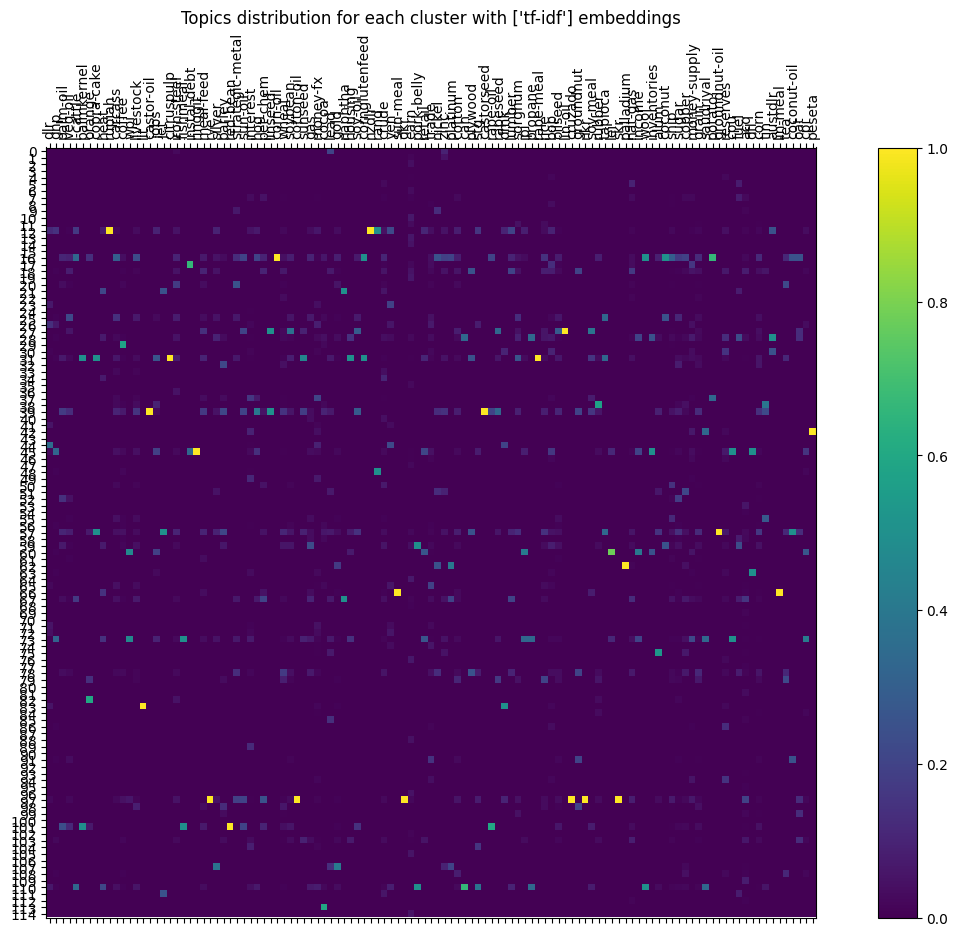

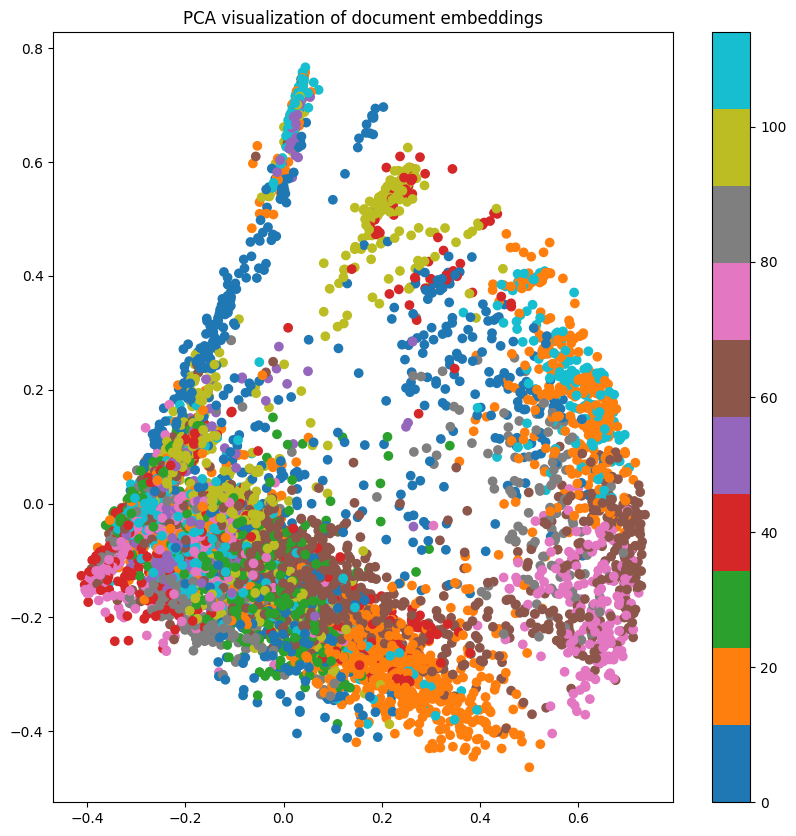

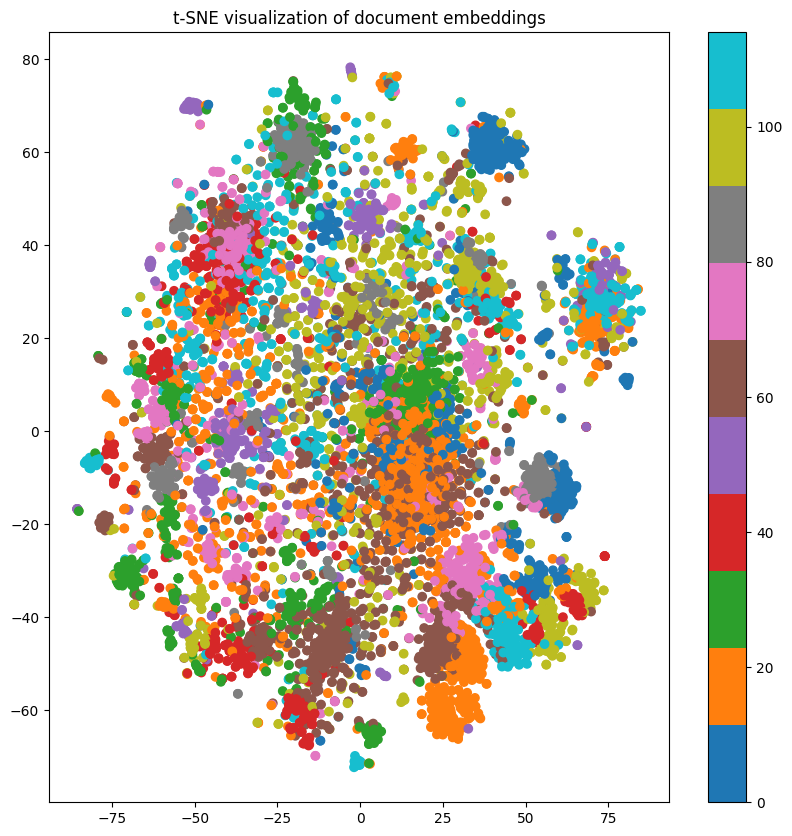

Using random state: 42
WSS: 46910.160729252064
Silhouette Score: 0.05005831643939018
Clusters Entropy Sum: 403.324462890625
Clusters Entropy Mean: 3.507169246673584
Clusters Entropy Median: 3.60445499420166
Purity: 0.3092396855354309
Mean Bit Count: 3.507169246673584
Sum Bit Count: 403.324462890625
Median Bit Count: 3.60445499420166
8816
115


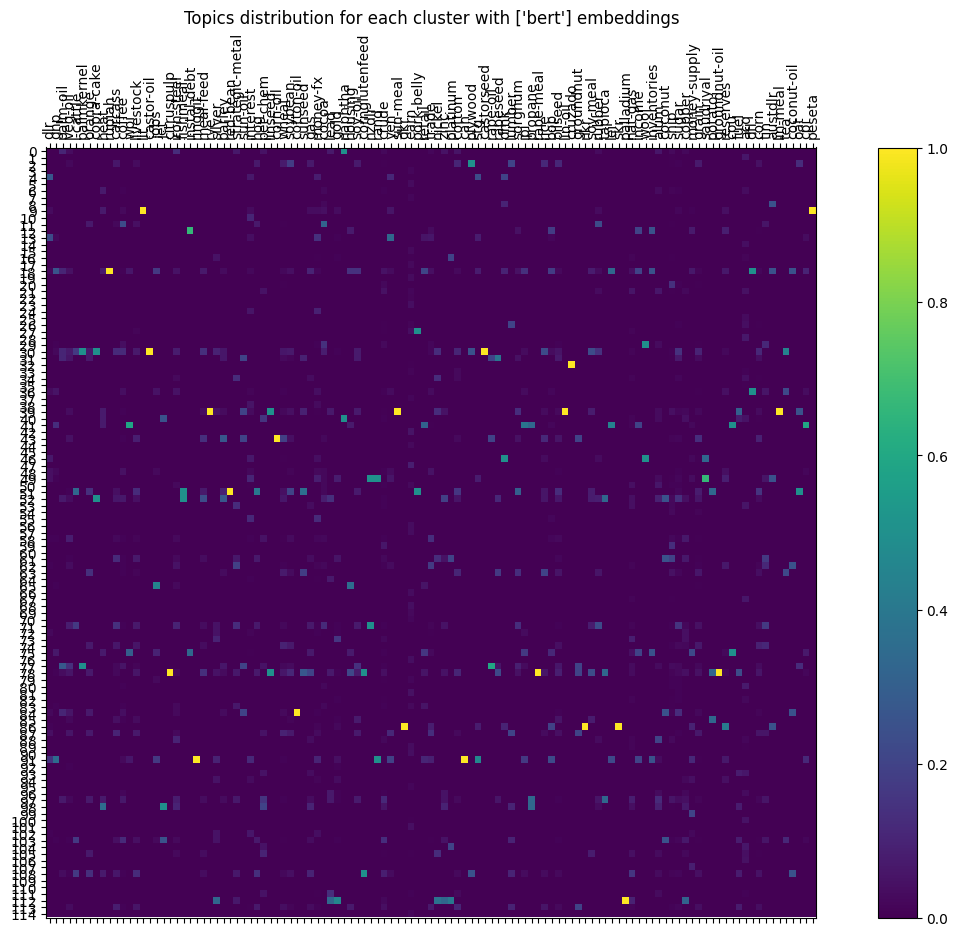

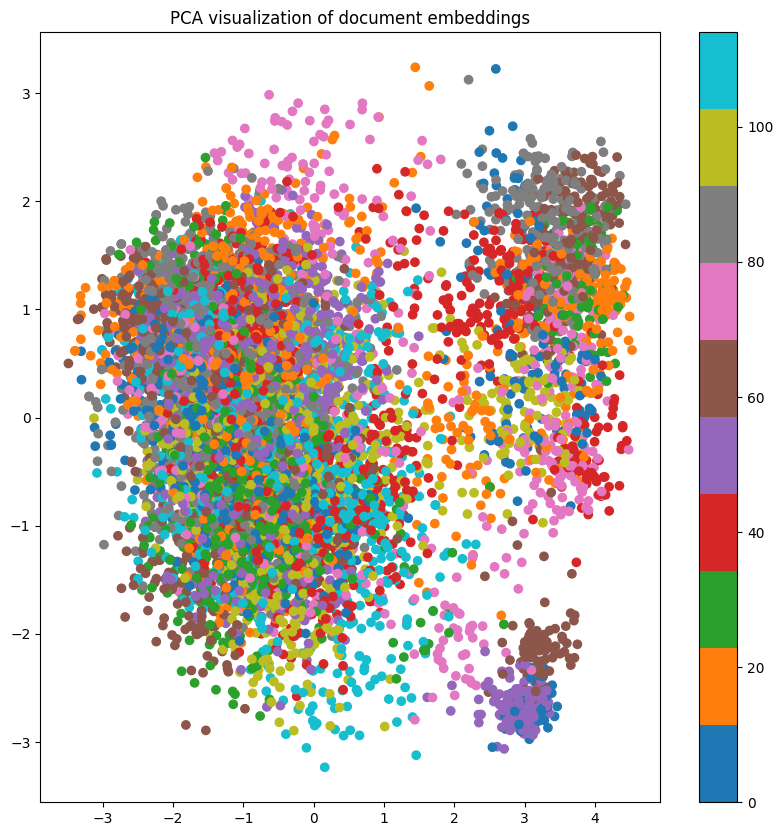

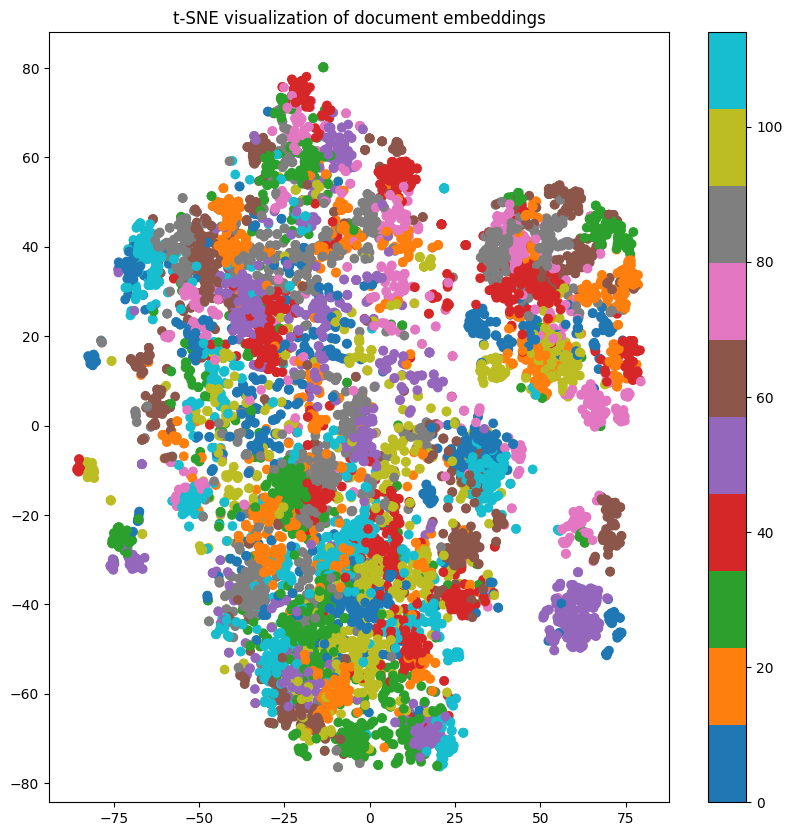

Using random state: 42
WSS: 132.2399930448129
Silhouette Score: 0.03234920462544718
Clusters Entropy Sum: 401.7592468261719
Clusters Entropy Mean: 3.493558645248413
Clusters Entropy Median: 3.5569019317626953
Purity: 0.3107171356678009
Mean Bit Count: 3.493558645248413
Sum Bit Count: 401.7592468261719
Median Bit Count: 3.5569024085998535
8816
115


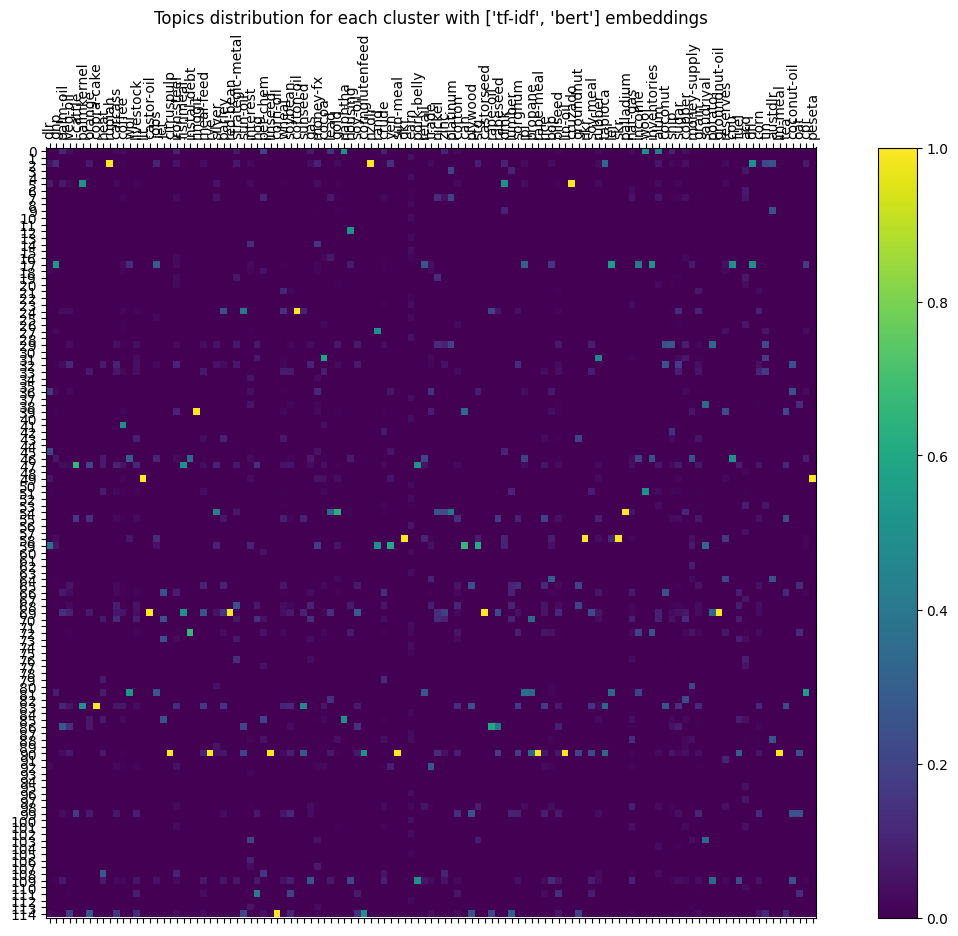

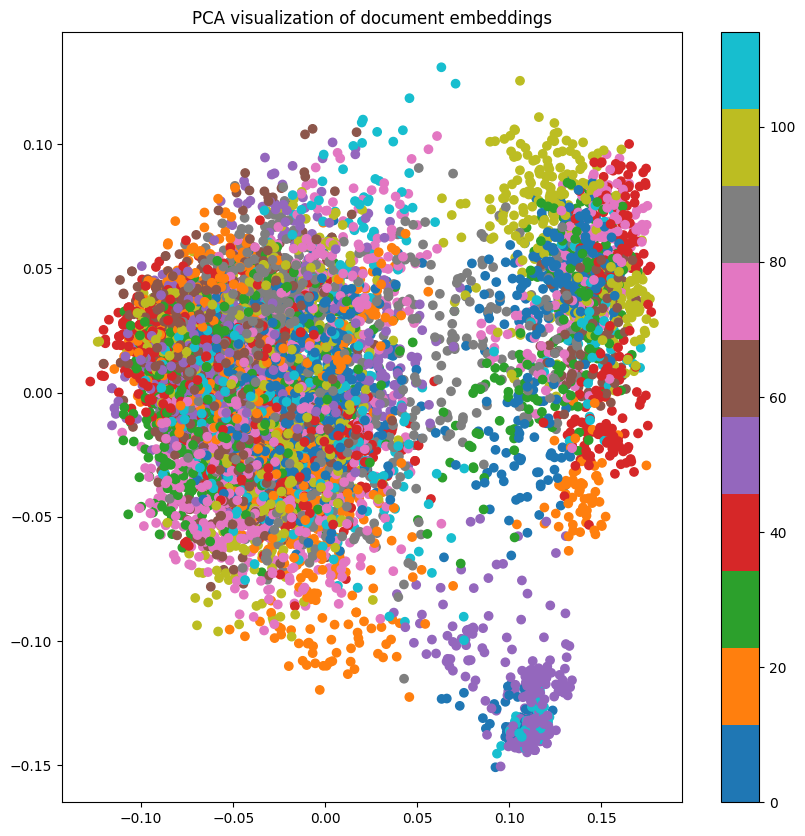

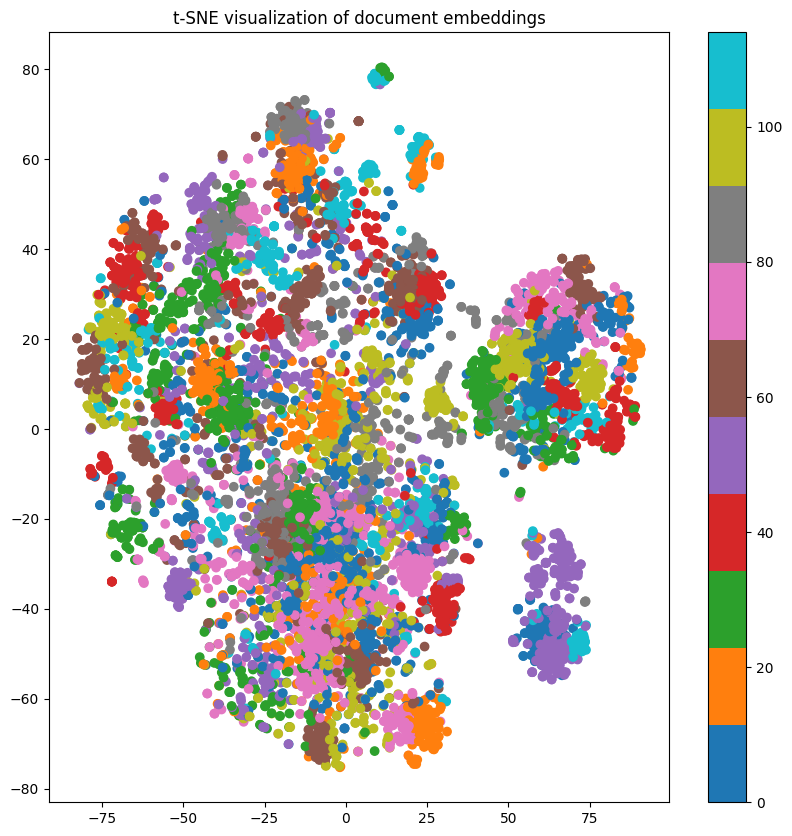

f_new wss: 132.2399930448129
(1/tf_idf_non_0)*f_tf_idf wss + (1/bert_non_0)*f_bert wss: 127.183203359862

f_new silhouette_avg: 0.03234920462544718
tf_idf silhouette_avg 0.013732064124898795
bert silhouette_avg 0.050058316

f_new mean_ent: 3.493558645248413
tf_idf mean_ent 3.3263142108917236
bert mean_ent 3.507169246673584

f_new purity: 0.3107171356678009
tf_idf purity 0.3108307719230652
bert purity 0.3092396855354309


In [59]:
cluster_topic_counts_tf_idf_euclidian, unormalized_cluster_topic_counts_tf_idf_euclidian, clustered_docs_tf_idf_euclidian, wss_tf_idf, silhouette_avg_tf_idf, mean_ent_tf_idf, purity_tf_idf = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['tf-idf'], agg_type='sum', method='kmeans', metric='euclidian')
cluster_topic_counts_bert_euclidian, unormalized_cluster_topic_counts_bert_euclidian, clustered_docs_bert_euclidian, wss_bert_euclidian, silhouette_bert_euclidian, mean_ent_bert_euclidian, purity__bert_euclidian = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['bert'], agg_type='sum', method='kmeans', metric='euclidian')
cluster_topic_counts_bert_tf_idf_euclidian, unormalized_cluster_topic_counts_bert_tf_idf_euclidian, clustered_docs_bert_tf_idf_euclidian, wss_bert_tf_idf_euclidian, silhouette_bert_tf_idf_euclidian, mean_ent_bert_tf_idf_euclidian, purity_bert_tf_idf_euclidian = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['tf-idf', 'bert'], agg_type='sum', method='kmeans', metric='euclidian')

tf_idf_idx = general_clustering_model.embbeders_to_idx['tf-idf']
bert_idx = general_clustering_model.embbeders_to_idx['bert']

bert_non_zero = general_clustering_model.mean_non_zero_entries['bert']
tf_idf_non_zero = general_clustering_model.mean_non_zero_entries['tf-idf']

tf_idf_dim = general_clustering_model.embeddings_per_doc_list[0][tf_idf_idx].shape[1]
bert_dim = general_clustering_model.embeddings_per_doc_list[0][bert_idx].shape[1]

print("f_new wss:" , wss_bert_tf_idf_euclidian)
print("(1/tf_idf_non_0)*f_tf_idf wss + (1/bert_non_0)*f_bert wss:", (1/tf_idf_non_zero)*wss_tf_idf + (1/bert_non_zero)*wss_bert_euclidian)
print()
print("f_new silhouette_avg:" , silhouette_bert_tf_idf_euclidian)
print("tf_idf silhouette_avg", silhouette_avg_tf_idf)
print("bert silhouette_avg", silhouette_bert_euclidian)

print()

print("f_new mean_ent:" , mean_ent_bert_tf_idf_euclidian)
print("tf_idf mean_ent", mean_ent_tf_idf)
print("bert mean_ent", mean_ent_bert_euclidian)

print()

print("f_new purity:" , purity_bert_tf_idf_euclidian)
print("tf_idf purity", purity_tf_idf)
print("bert purity", purity__bert_euclidian)

# Window = $\infty$

Using random state: 42
WSS: 5259.516383529362
Silhouette Score: 0.013732064124898795
Clusters Entropy Sum: 382.526123046875
Clusters Entropy Mean: 3.3263142108917236
Clusters Entropy Median: 3.42846941947937
Purity: 0.3108307719230652
Mean Bit Count: 3.3263144493103027
Sum Bit Count: 382.5261535644531
Median Bit Count: 3.428468704223633
8816
115


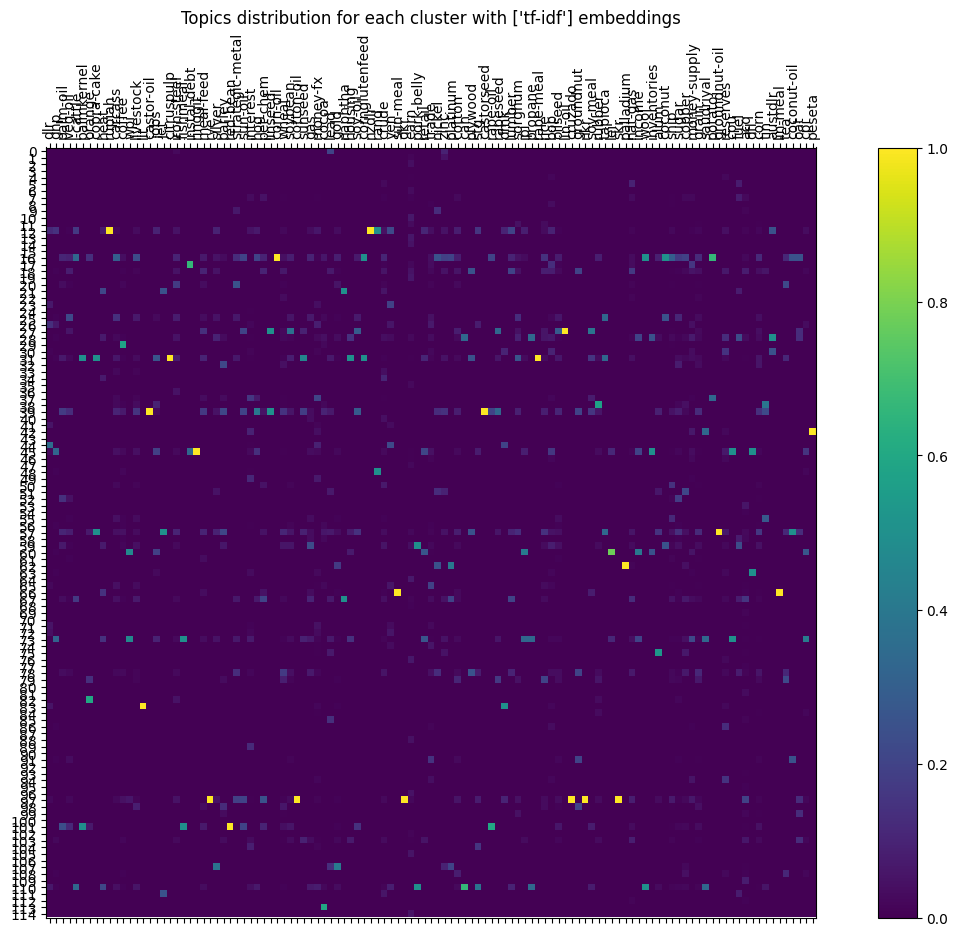

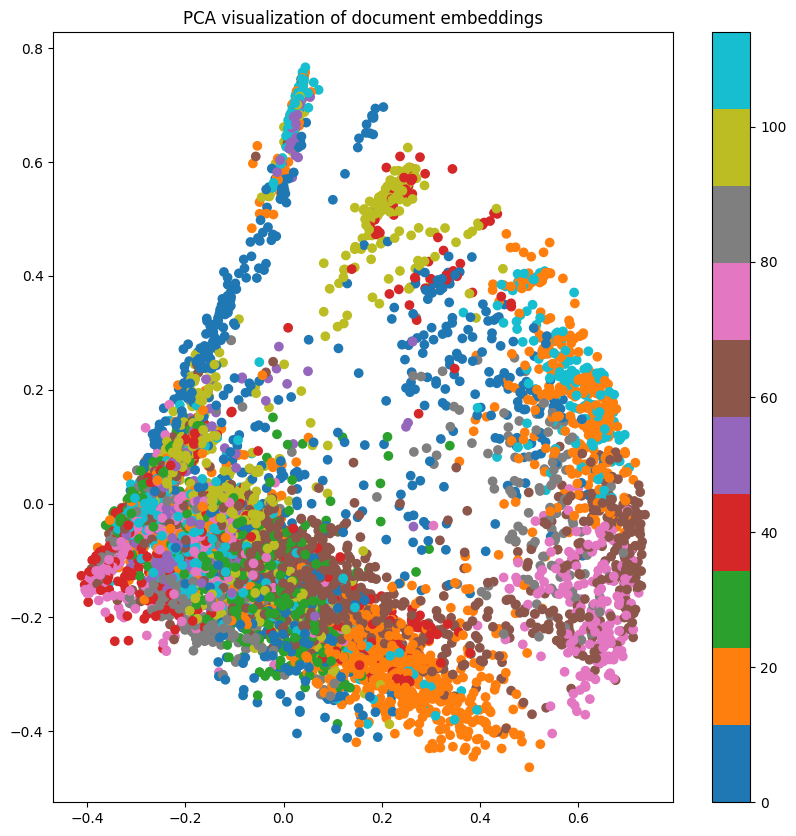

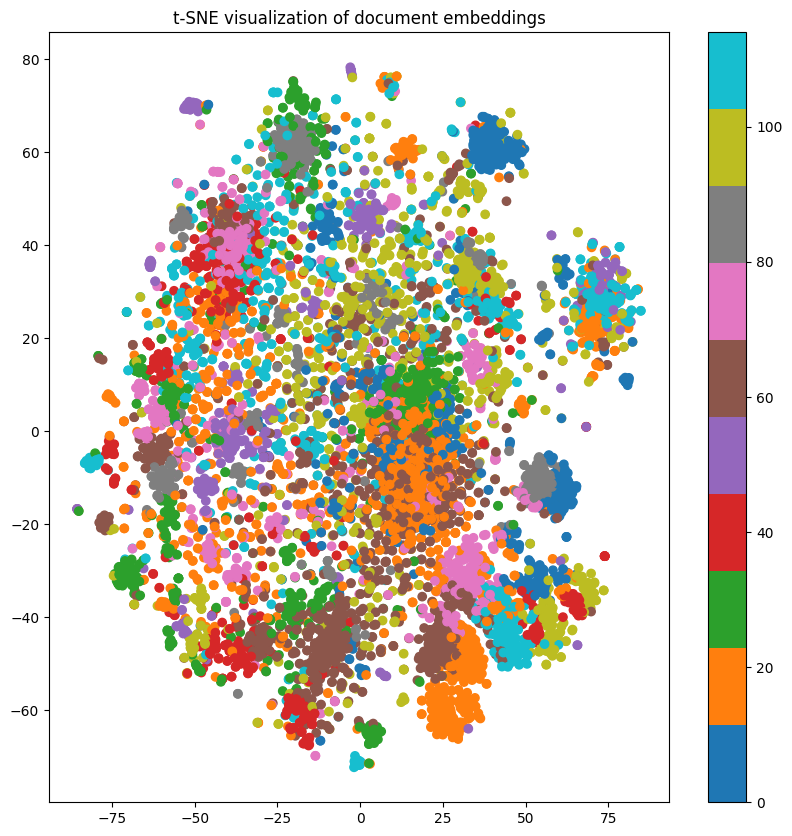

Using random state: 42
WSS: 46910.160729252064
Silhouette Score: 0.05005831643939018
Clusters Entropy Sum: 403.324462890625
Clusters Entropy Mean: 3.507169246673584
Clusters Entropy Median: 3.60445499420166
Purity: 0.3092396855354309
Mean Bit Count: 3.507169246673584
Sum Bit Count: 403.324462890625
Median Bit Count: 3.60445499420166
8816
115


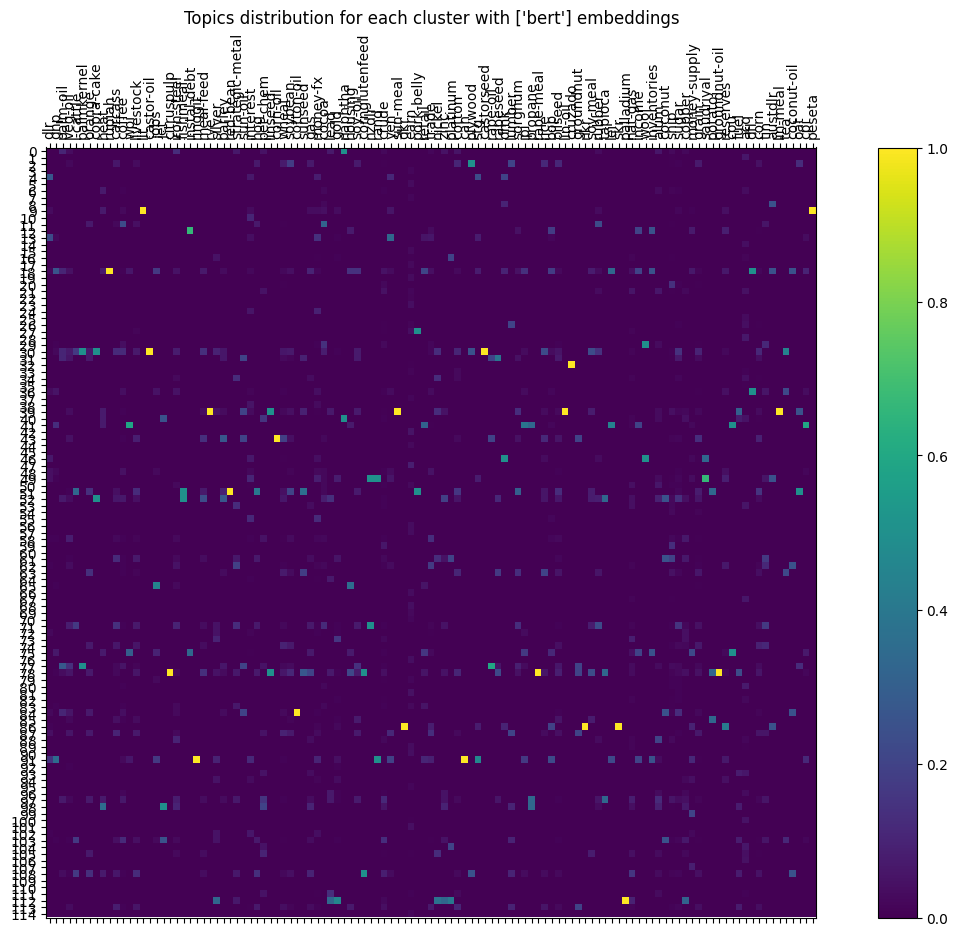

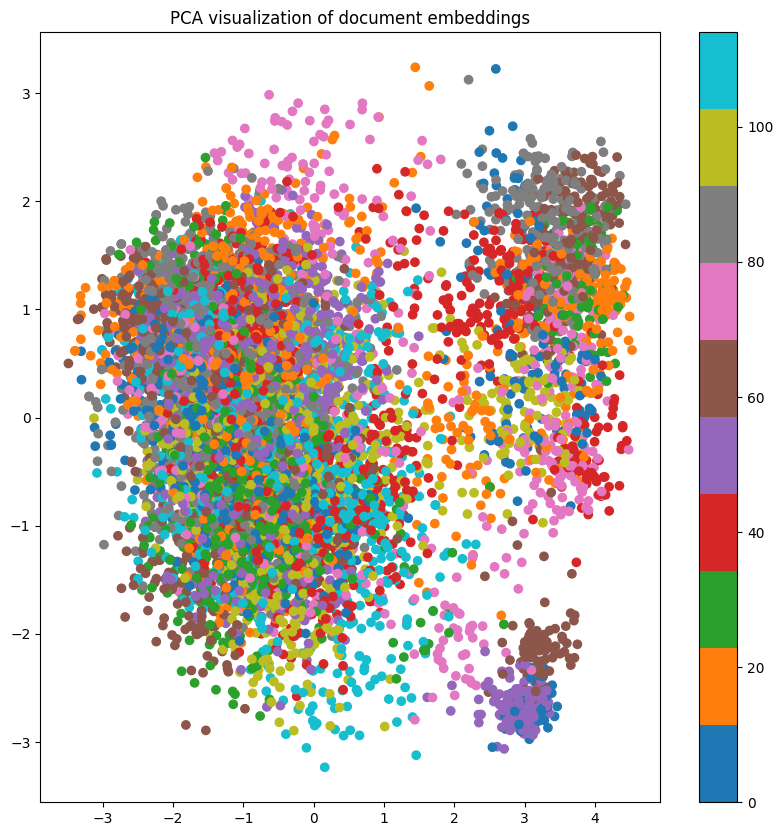

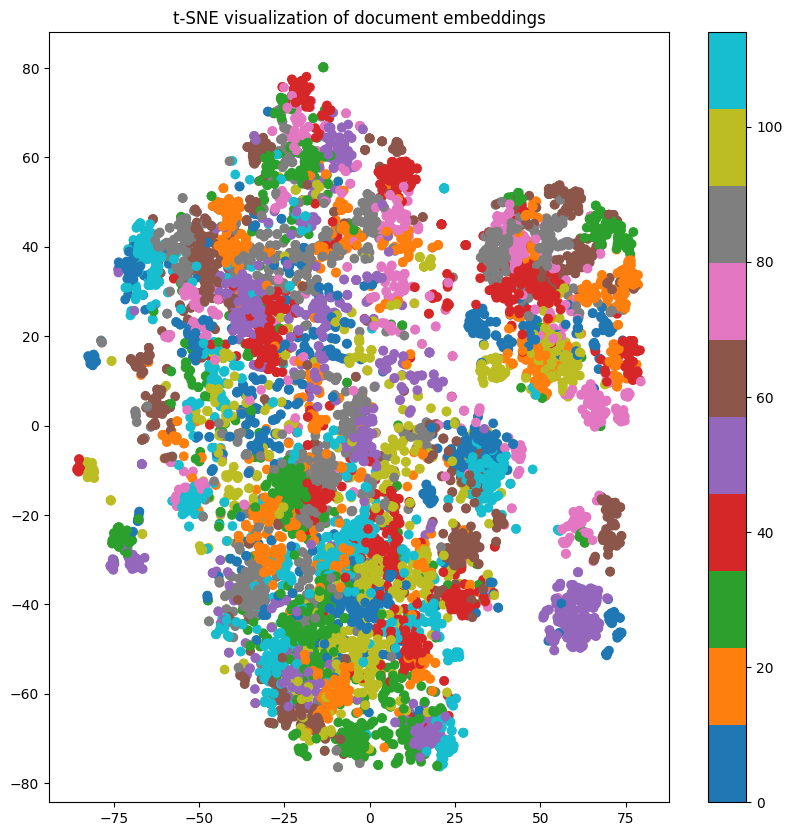

Using random state: 42
WSS: 132.2399930448129
Silhouette Score: 0.03234920462544718
Clusters Entropy Sum: 401.7592468261719
Clusters Entropy Mean: 3.493558645248413
Clusters Entropy Median: 3.5569019317626953
Purity: 0.3107171356678009
Mean Bit Count: 3.493558645248413
Sum Bit Count: 401.7592468261719
Median Bit Count: 3.5569024085998535
8816
115


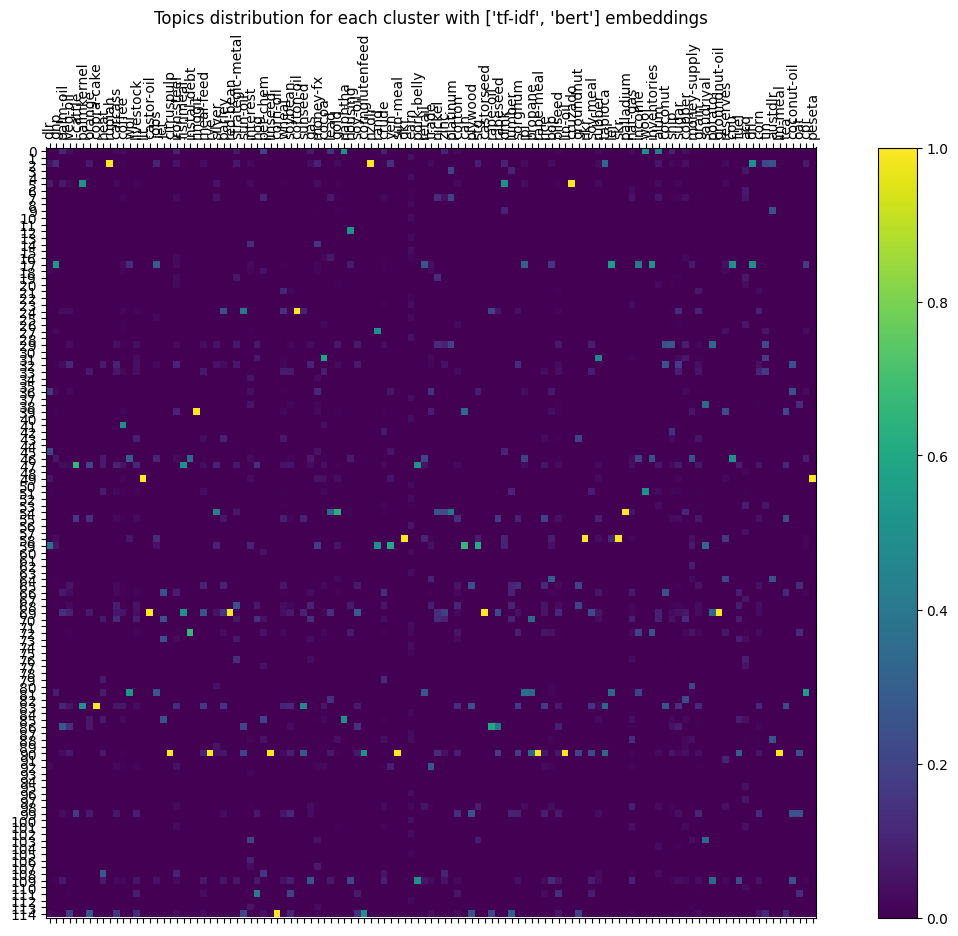

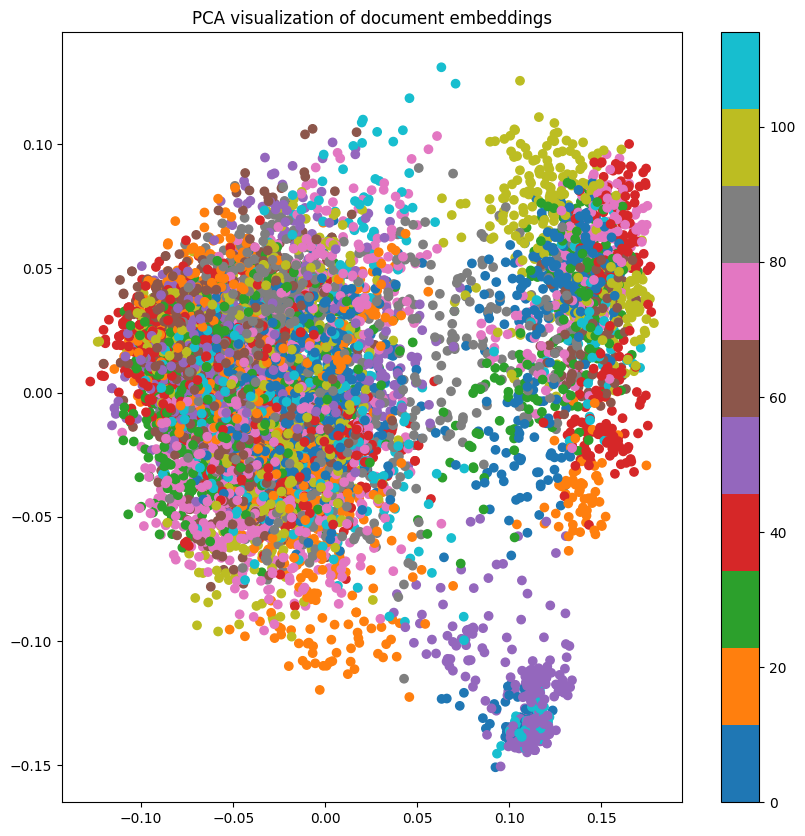

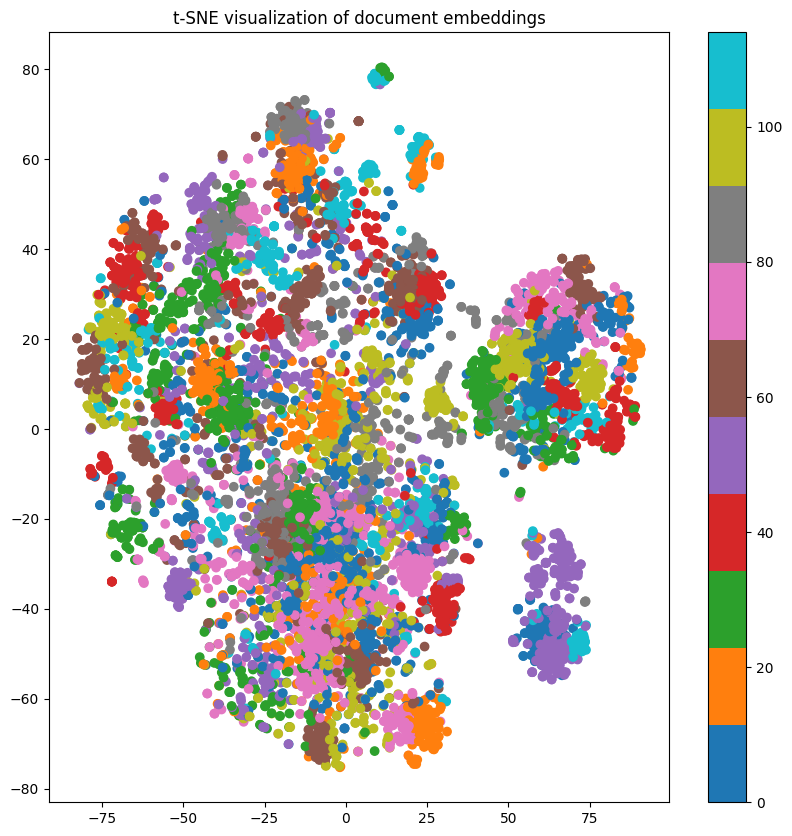

f_new wss: 132.2399930448129
(1/tf_idf_non_0)*f_tf_idf wss + (1/bert_non_0)*f_bert wss: 127.183203359862

f_new silhouette_avg: 0.03234920462544718
tf_idf silhouette_avg 0.013732064124898795
bert silhouette_avg 0.050058316

f_new mean_ent: 3.493558645248413
tf_idf mean_ent 3.3263142108917236
bert mean_ent 3.507169246673584

f_new purity: 0.3107171356678009
tf_idf purity 0.3108307719230652
bert purity 0.3092396855354309


In [ ]:
# cluster_topic_counts_tf_idf_euclidian, unormalized_cluster_topic_counts_tf_idf_euclidian, clustered_docs_tf_idf_euclidian, wss_tf_idf, silhouette_avg_tf_idf, mean_ent_tf_idf, purity_tf_idf = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['tf-idf'], agg_type='sum', method='kmeans', metric='euclidian')
# cluster_topic_counts_bert_euclidian, unormalized_cluster_topic_counts_bert_euclidian, clustered_docs_bert_euclidian, wss_bert_euclidian, silhouette_bert_euclidian, mean_ent_bert_euclidian, purity__bert_euclidian = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['bert'], agg_type='sum', method='kmeans', metric='euclidian')
# cluster_topic_counts_bert_tf_idf_euclidian, unormalized_cluster_topic_counts_bert_tf_idf_euclidian, clustered_docs_bert_tf_idf_euclidian, wss_bert_tf_idf_euclidian, silhouette_bert_tf_idf_euclidian, mean_ent_bert_tf_idf_euclidian, purity_bert_tf_idf_euclidian = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['tf-idf', 'bert'], agg_type='sum', method='kmeans', metric='euclidian')

# tf_idf_idx = general_clustering_model.embbeders_to_idx['tf-idf']
# bert_idx = general_clustering_model.embbeders_to_idx['bert']

# bert_non_zero = general_clustering_model.mean_non_zero_entries['bert']
# tf_idf_non_zero = general_clustering_model.mean_non_zero_entries['tf-idf']

# tf_idf_dim = general_clustering_model.embeddings_per_doc_list[0][tf_idf_idx].shape[1]
# bert_dim = general_clustering_model.embeddings_per_doc_list[0][bert_idx].shape[1]

# print("f_new wss:" , wss_bert_tf_idf_euclidian)
# print("(1/tf_idf_non_0)*f_tf_idf wss + (1/bert_non_0)*f_bert wss:", (1/tf_idf_non_zero)*wss_tf_idf + (1/bert_non_zero)*wss_bert_euclidian)
# print()
# print("f_new silhouette_avg:" , silhouette_bert_tf_idf_euclidian)
# print("tf_idf silhouette_avg", silhouette_avg_tf_idf)
# print("bert silhouette_avg", silhouette_bert_euclidian)

# print()

# print("f_new mean_ent:" , mean_ent_bert_tf_idf_euclidian)
# print("tf_idf mean_ent", mean_ent_tf_idf)
# print("bert mean_ent", mean_ent_bert_euclidian)

# print()

# print("f_new purity:" , purity_bert_tf_idf_euclidian)
# print("tf_idf purity", purity_tf_idf)
# print("bert purity", purity__bert_euclidian)

Using random state: 42
WSS: 5250.535852035328
Silhouette Score: 0.013932950233695965
8816
115


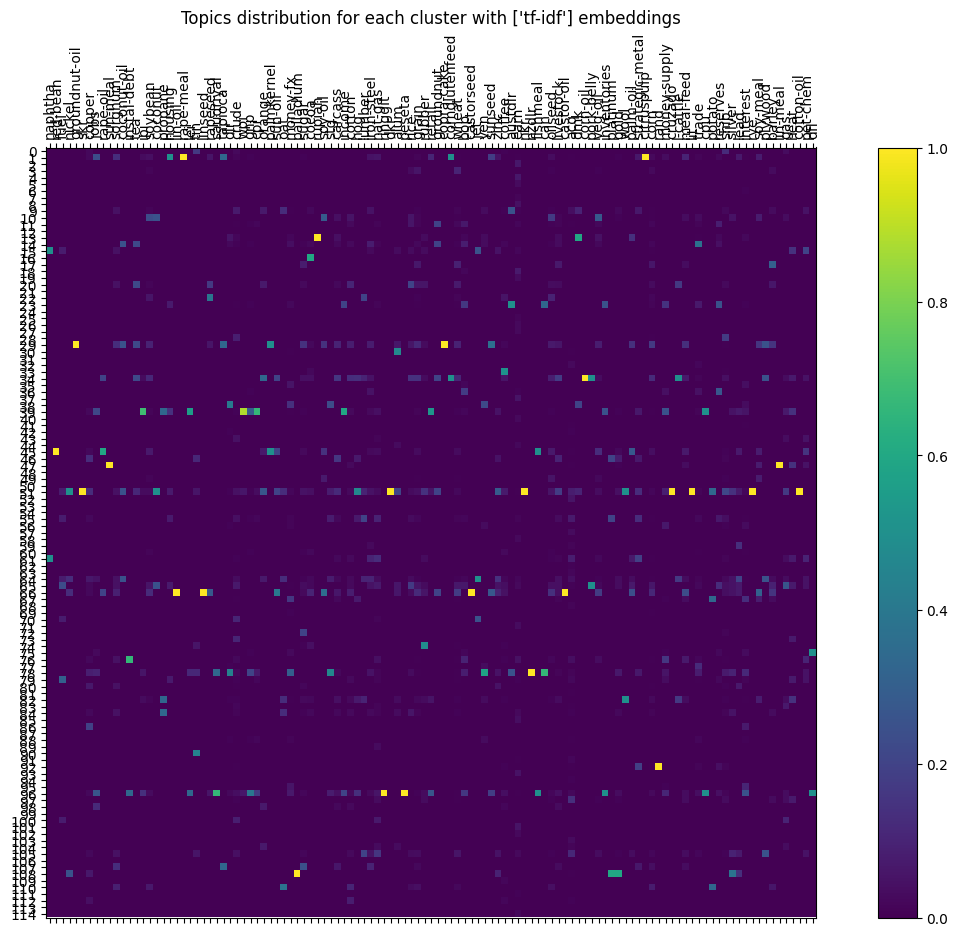

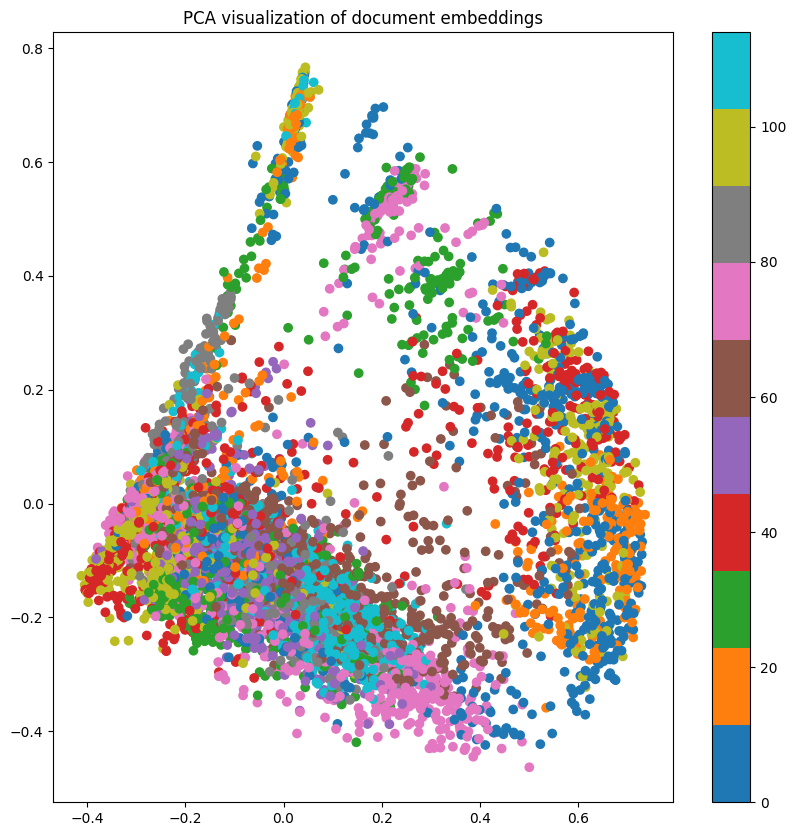

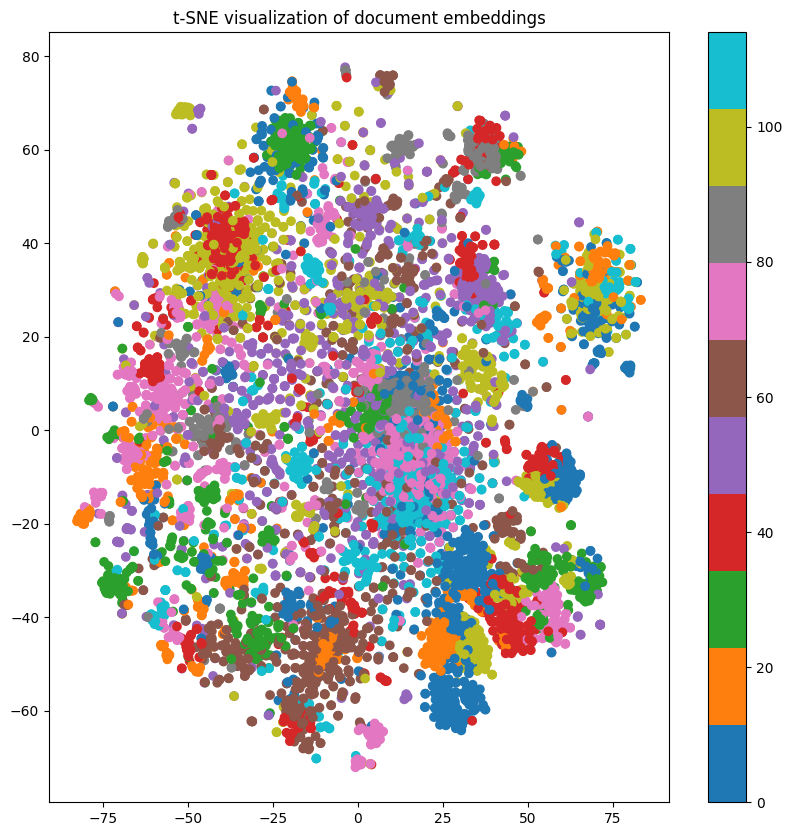

Using random state: 42
WSS: 47116.35691572493
Silhouette Score: 0.053683068603277206
8816
115


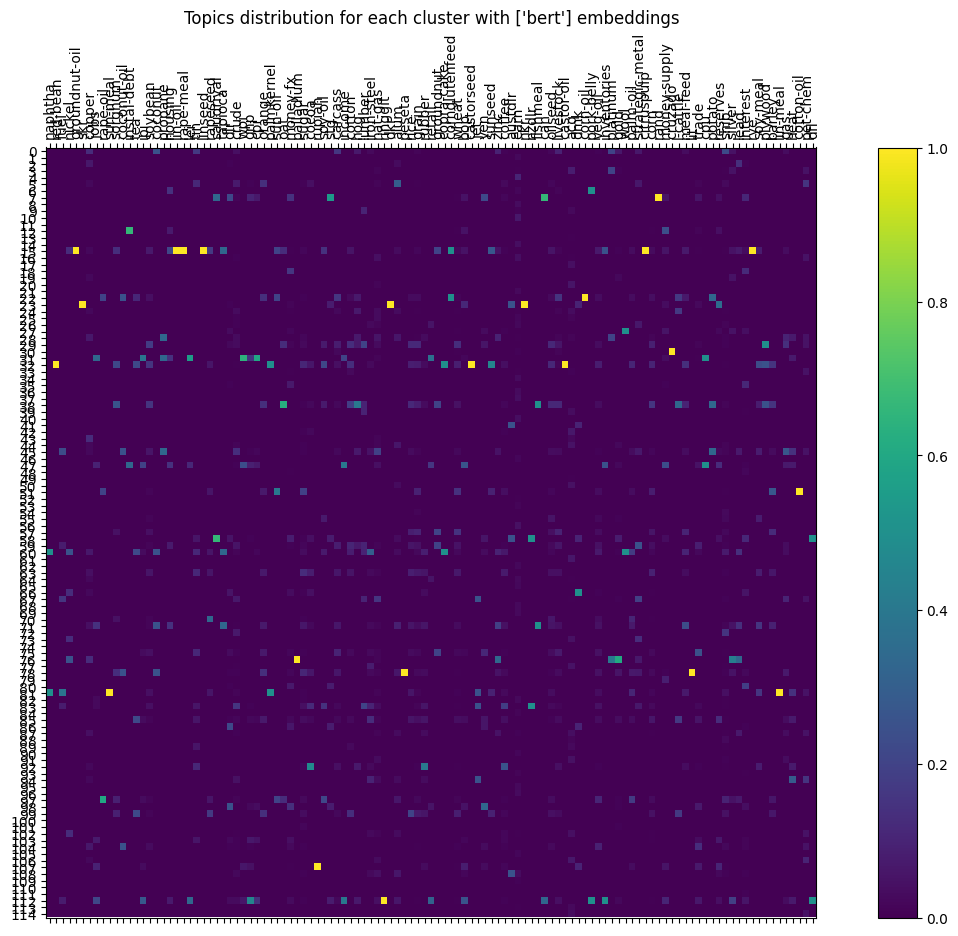

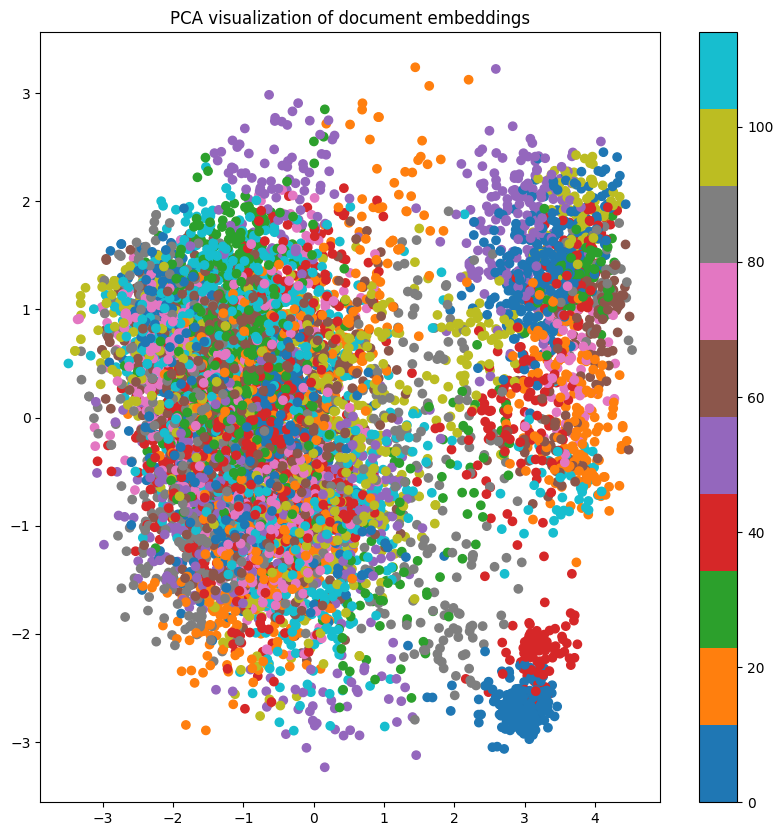

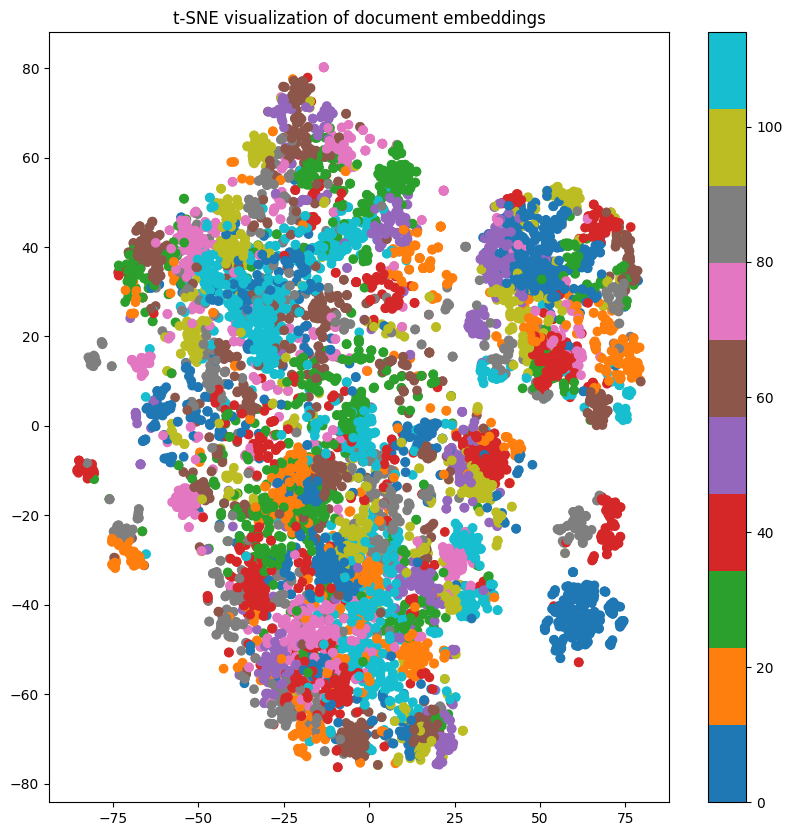

Using random state: 42
WSS: 0.08240579774996909
Silhouette Score: 0.046335226268980026
8816
115


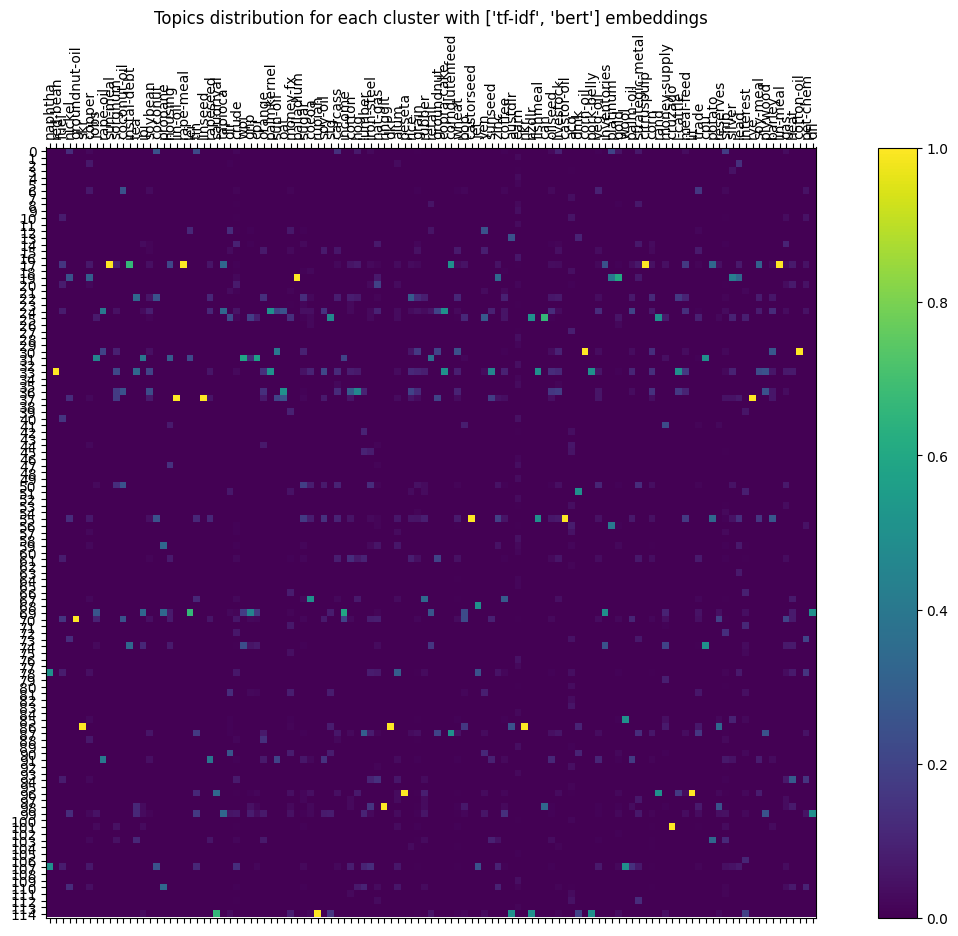

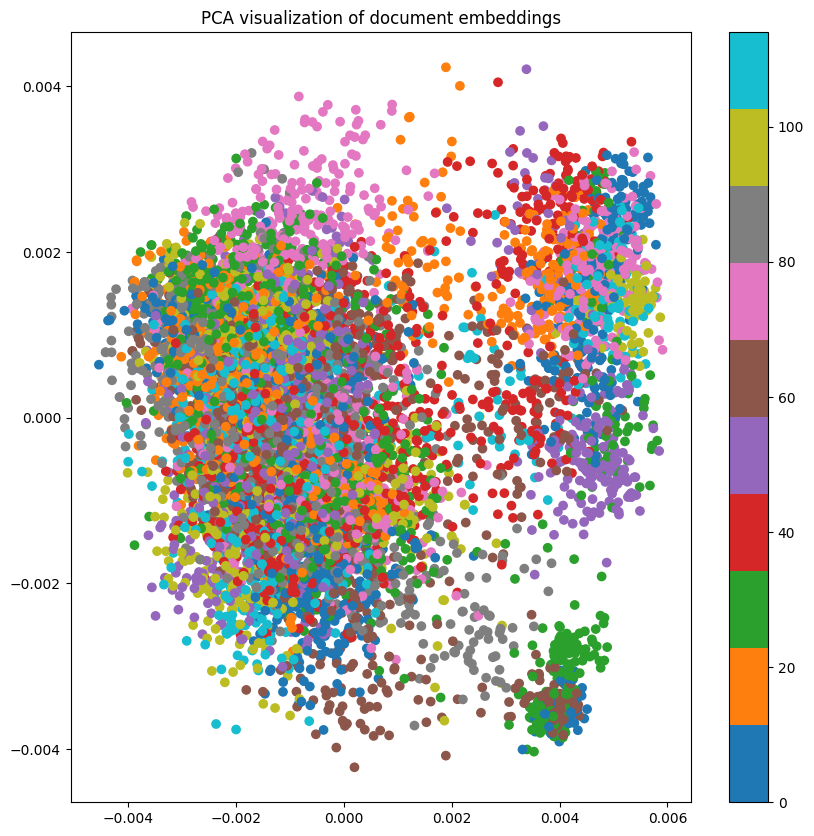

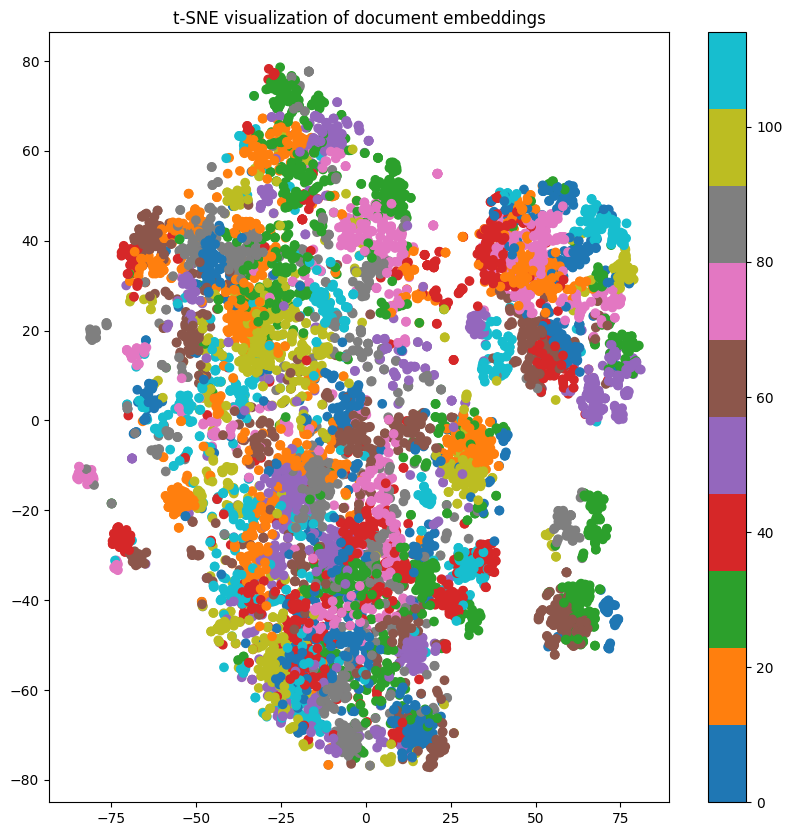

f_new wss: 0.08240579774996909
(1/tf_idf_dim)*f_tf_idf wss + (1/bert_dim)*f_bert wss: 61.54915434595772
f_new silhouette_avg: 0.046335226268980026
tf_idf silhouette_avg 0.013932950233695965
bert silhouette_avg 0.05368307


In [ ]:
# cluster_topic_counts_tf_idf_euclidian, unormalized_cluster_topic_counts_tf_idf_euclidian, clustered_docs_tf_idf_euclidian, wss_tf_idf, silhouette_avg_tf_idf = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['tf-idf'], agg_type='sum', method='kmeans', metric='euclidian')
# cluster_topic_counts_bert_euclidian, unormalized_cluster_topic_counts_bert_euclidian, clustered_docs_bert_euclidian, wss_bert_euclidian, silhouette_bert_euclidian = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['bert'], agg_type='sum', method='kmeans', metric='euclidian')
# cluster_topic_counts_bert_tf_idf_euclidian, unormalized_cluster_topic_counts_bert_tf_idf_euclidian, clustered_docs_bert_tf_idf_euclidian, wss_bert_tf_idf_euclidian, silhouette_bert_tf_idf_euclidian = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['tf-idf', 'bert'], agg_type='sum', method='kmeans', metric='euclidian')

# tf_idf_idx = general_clustering_model.embbeders_to_idx['tf-idf']
# bert_idx = general_clustering_model.embbeders_to_idx['bert']

# tf_idf_dim = general_clustering_model.embeddings_per_doc_list[0][tf_idf_idx].shape[1]
# bert_dim = general_clustering_model.embeddings_per_doc_list[0][bert_idx].shape[1]

# print("f_new wss:" , wss_bert_tf_idf_euclidian)
# print("(1/tf_idf_dim)*f_tf_idf wss + (1/bert_dim)*f_bert wss:", (1/tf_idf_dim)*wss_tf_idf + (1/bert_dim)*wss_bert_euclidian)

# print("f_new silhouette_avg:" , silhouette_bert_tf_idf_euclidian)
# print("tf_idf silhouette_avg", silhouette_avg_tf_idf)
# print("bert silhouette_avg", silhouette_bert_euclidian)

In [44]:
tf_idf_dim = general_clustering_model.embeddings_per_doc_list[0][tf_idf_idx].shape[1]
bert_dim = general_clustering_model.embeddings_per_doc_list[0][bert_idx].shape[1]

bert_non_zero = general_clustering_model.mean_non_zero_entries['bert']
tf_idf_non_zero = general_clustering_model.mean_non_zero_entries['tf-idf']

print("f_new wss:" , wss_bert_tf_idf_euclidian)
print("(1/tf_idf_dim)*f_tf_idf wss + (1/bert_dim)*f_bert wss:", (1/(tf_idf_dim*bert_non_zero))*wss_tf_idf + (1/(bert_dim*bert_non_zero))*wss_bert_euclidian)

print("f_new silhouette_avg:" , silhouette_bert_tf_idf_euclidian)
print("tf_idf silhouette_avg", silhouette_avg_tf_idf)
print("bert silhouette_avg", silhouette_bert_euclidian)

f_new wss: 772.4233023939207
(1/tf_idf_dim)*f_tf_idf wss + (1/bert_dim)*f_bert wss: 0.42020950200035556
f_new silhouette_avg: 0.06247689987276221
tf_idf silhouette_avg -0.03865114078221851
bert silhouette_avg 0.08565315


# Window = 100

Using random state: 42
WSS: 18240.46715222459
Silhouette Score: -0.05136218080582422
Clusters Entropy Sum: 256.92364501953125
Clusters Entropy Mean: 2.3146274089813232
Clusters Entropy Median: 2.521928310394287
Purity: 0.3123082220554352
Mean Bit Count: 2.3146274089813232
Sum Bit Count: 256.92364501953125
Median Bit Count: 2.521928548812866
8816
115


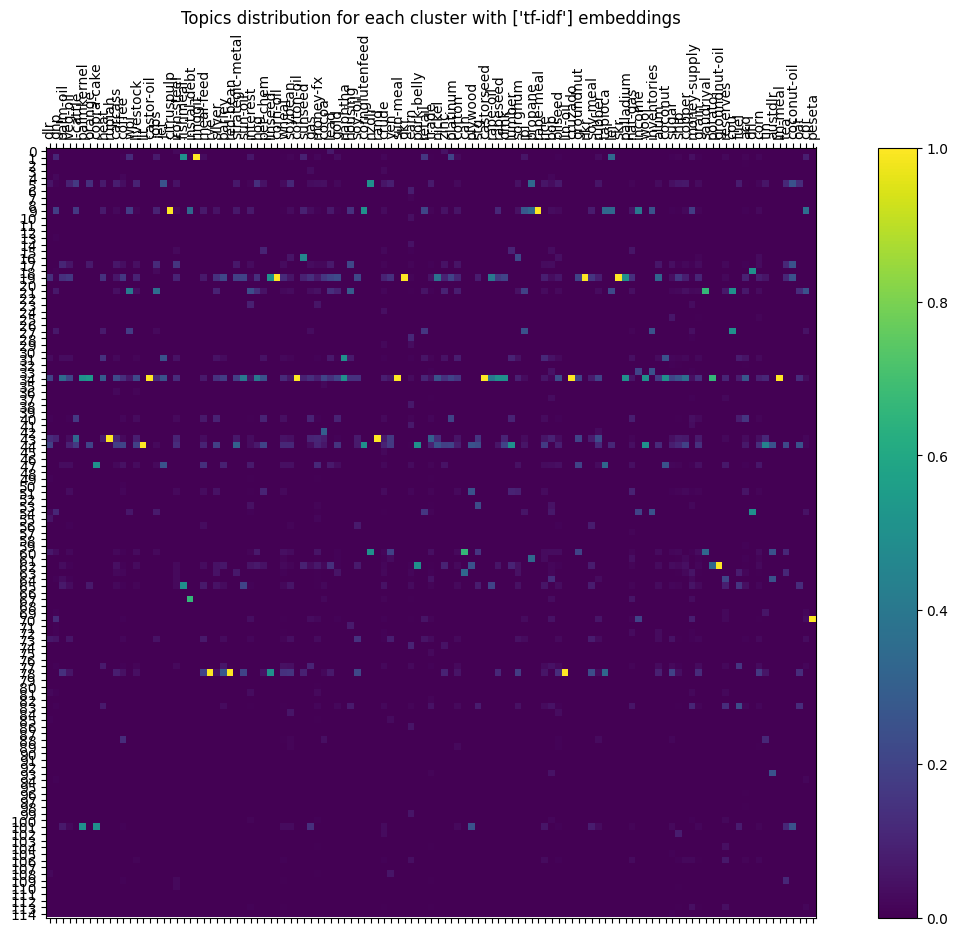

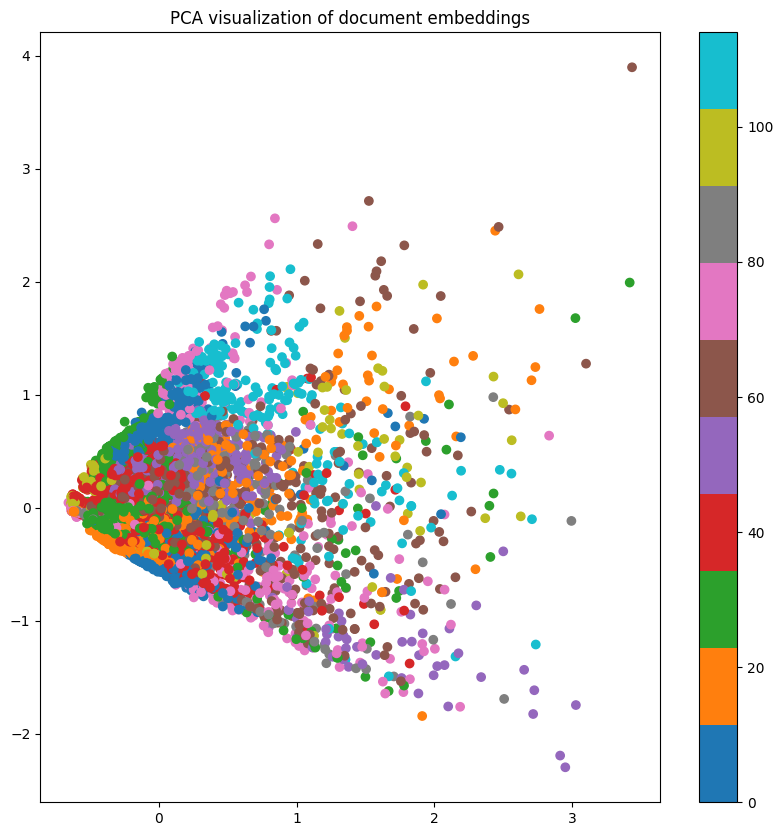

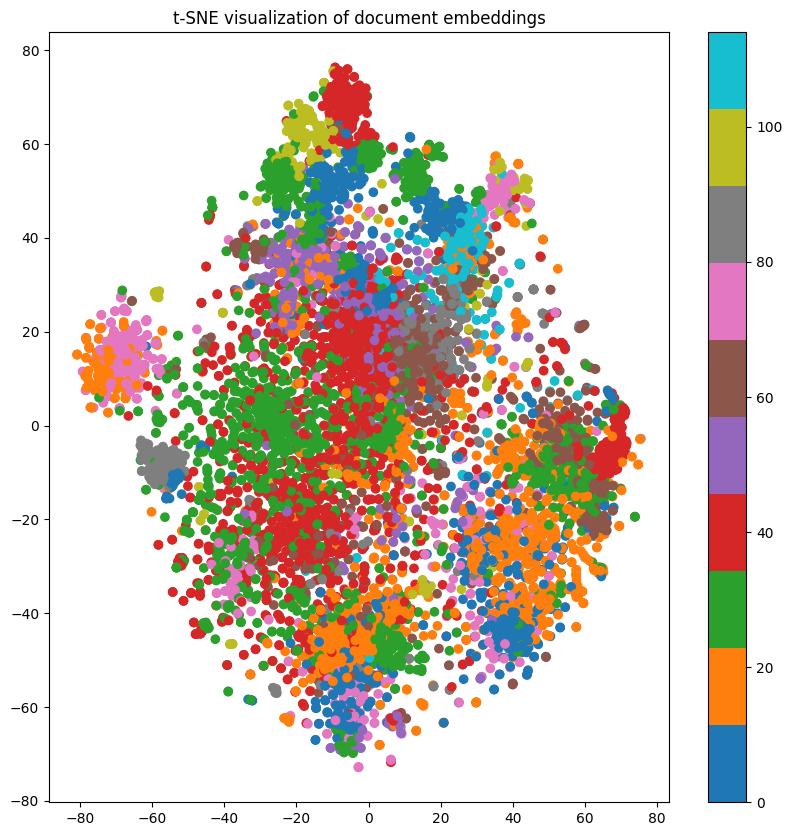

Using random state: 42
WSS: 249087.12439243673
Silhouette Score: 0.08394897729158401
Clusters Entropy Sum: 339.89288330078125
Clusters Entropy Mean: 2.9815165996551514
Clusters Entropy Median: 3.2402241230010986
Purity: 0.3123082220554352
Mean Bit Count: 2.9815165996551514
Sum Bit Count: 339.89288330078125
Median Bit Count: 3.2402241230010986
8816
115


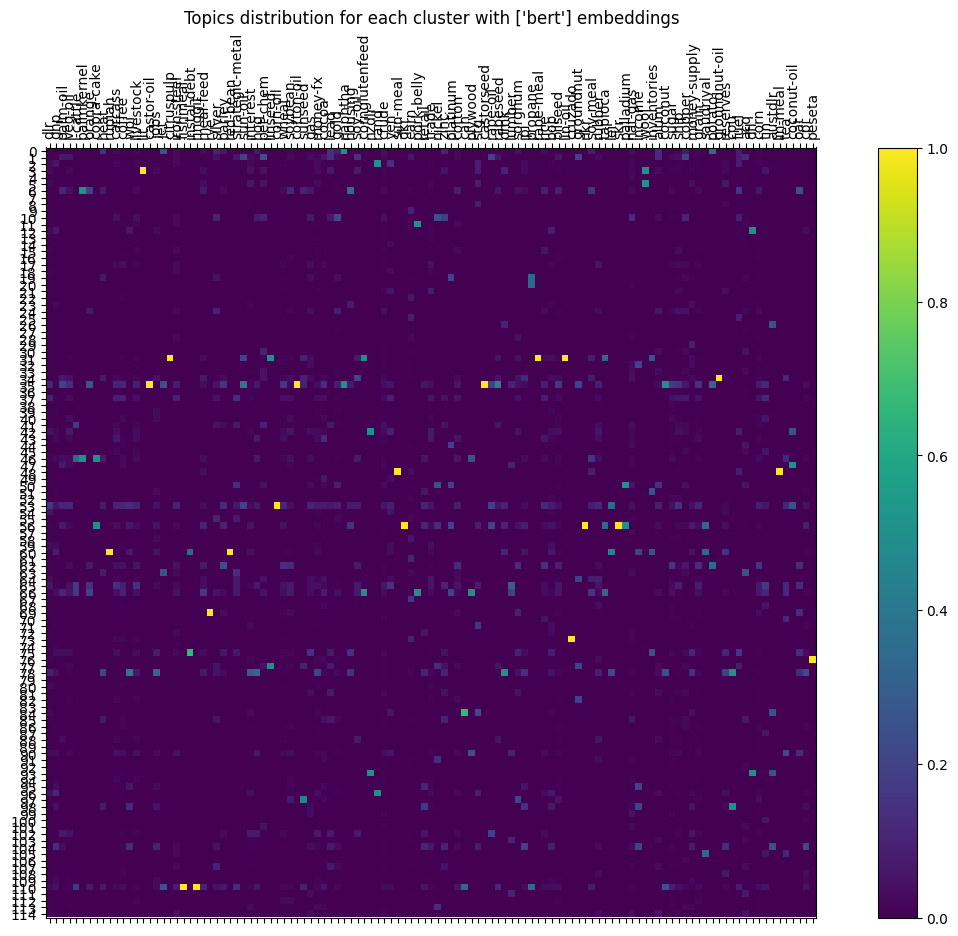

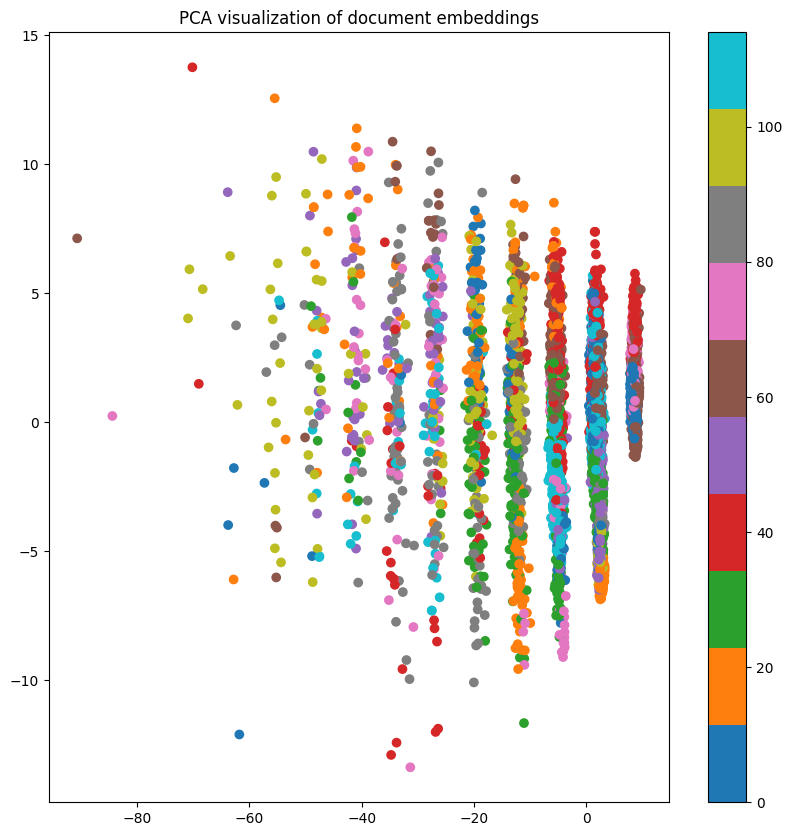

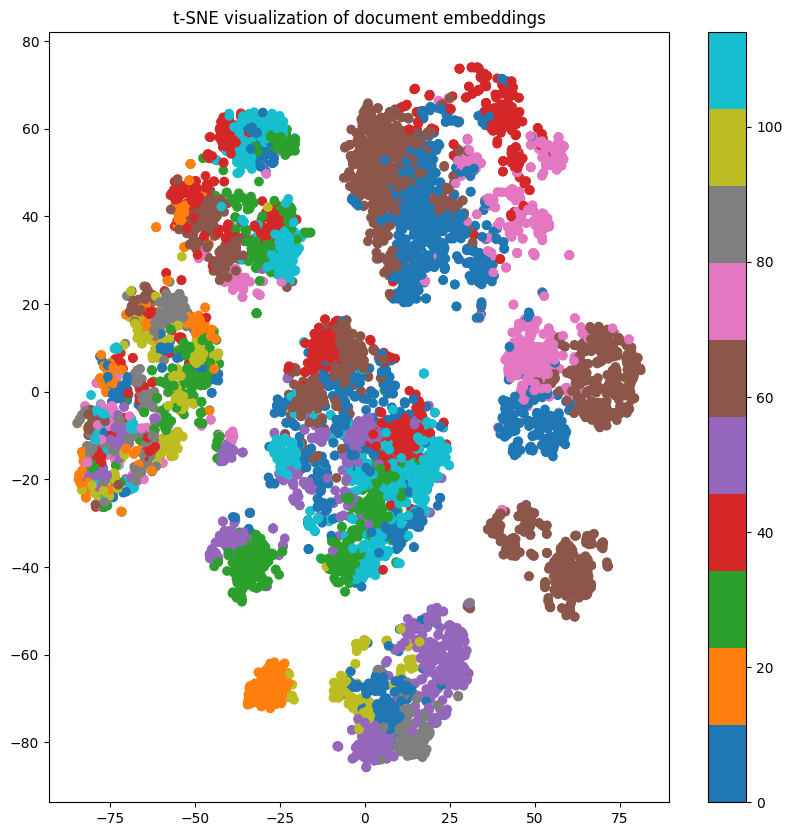

Using random state: 42
WSS: 776.2271336341754
Silhouette Score: 0.047734471357011816
Clusters Entropy Sum: 322.408203125
Clusters Entropy Mean: 2.8281421661376953
Clusters Entropy Median: 2.978095531463623
Purity: 0.31242185831069946
Mean Bit Count: 2.8281421661376953
Sum Bit Count: 322.408203125
Median Bit Count: 2.978095769882202
8816
115


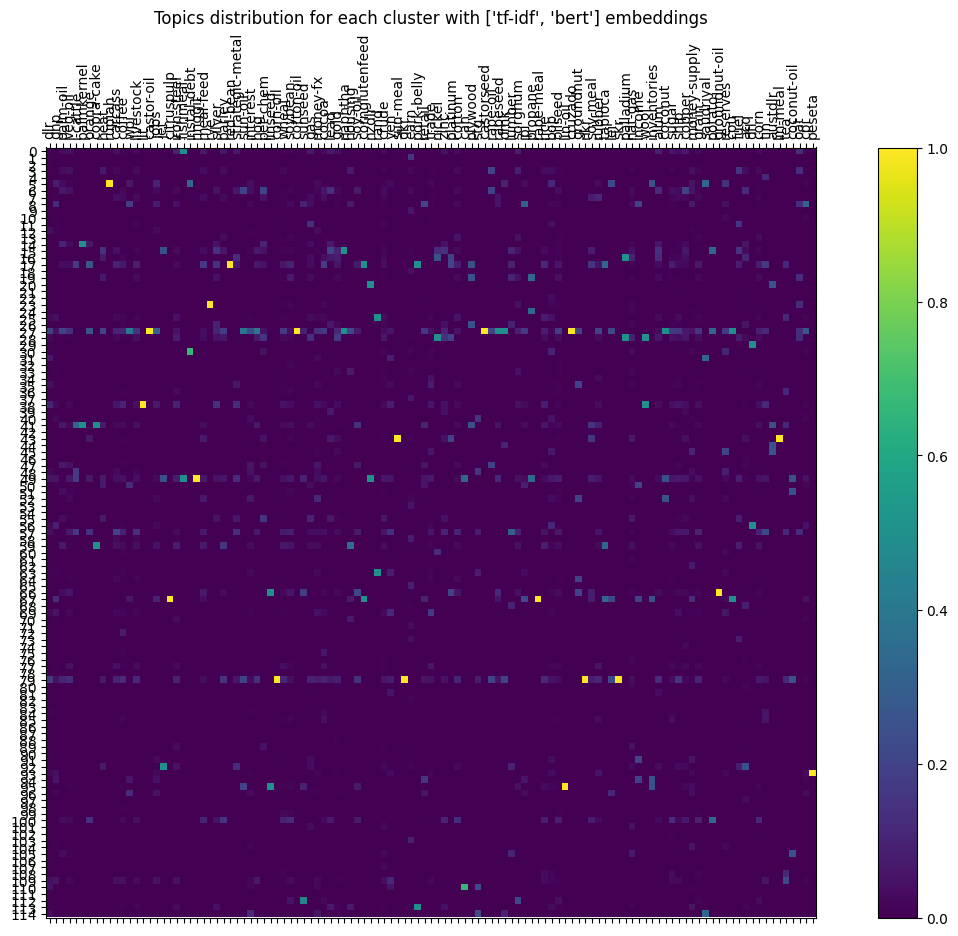

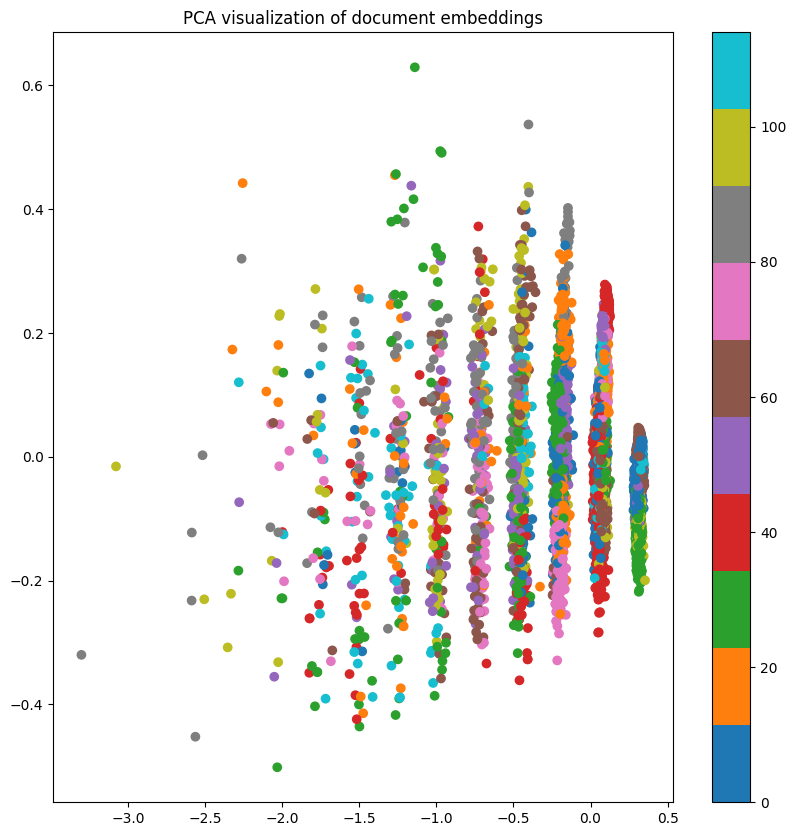

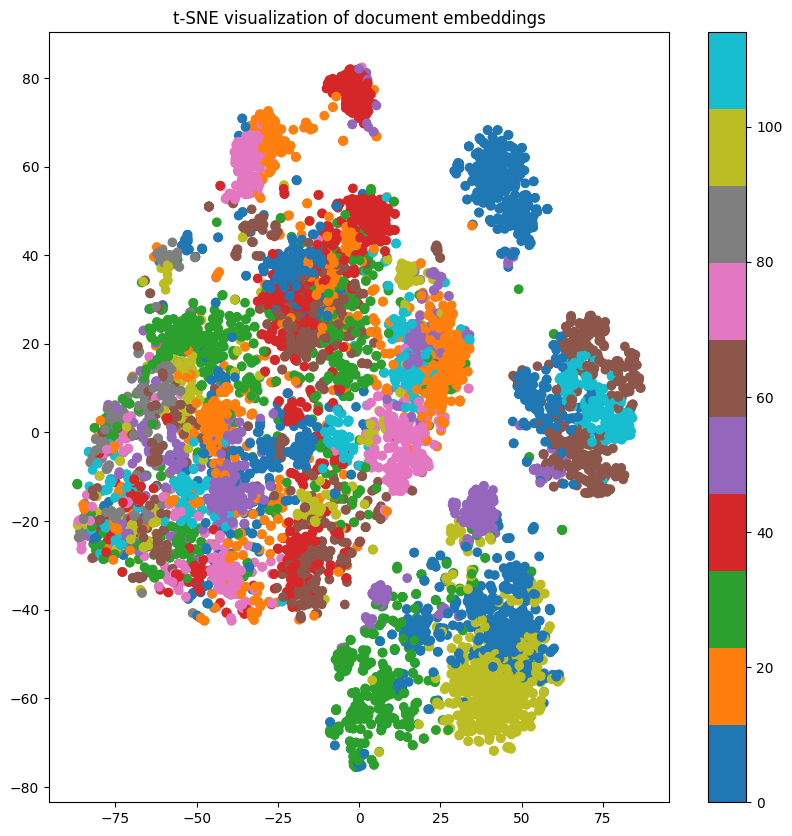

f_new wss: 776.2271336341754
(1/tf_idf_non_0)*f_tf_idf wss + (1/bert_non_0)*f_bert wss: 735.2772124352507

f_new silhouette_avg: 0.047734471357011816
tf_idf silhouette_avg -0.05136218080582422
bert silhouette_avg 0.08394898

f_new mean_ent: 2.8281421661376953
tf_idf mean_ent 2.3146274089813232
bert mean_ent 2.9815165996551514

f_new purity: 0.31242185831069946
tf_idf purity 0.3123082220554352
bert purity 0.3123082220554352


In [63]:
cluster_topic_counts_tf_idf_euclidian, unormalized_cluster_topic_counts_tf_idf_euclidian, clustered_docs_tf_idf_euclidian, wss_tf_idf, silhouette_avg_tf_idf, mean_ent_tf_idf, purity_tf_idf = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['tf-idf'], agg_type='sum', method='kmeans', metric='euclidian')
cluster_topic_counts_bert_euclidian, unormalized_cluster_topic_counts_bert_euclidian, clustered_docs_bert_euclidian, wss_bert_euclidian, silhouette_bert_euclidian, mean_ent_bert_euclidian, purity__bert_euclidian = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['bert'], agg_type='sum', method='kmeans', metric='euclidian')
cluster_topic_counts_bert_tf_idf_euclidian, unormalized_cluster_topic_counts_bert_tf_idf_euclidian, clustered_docs_bert_tf_idf_euclidian, wss_bert_tf_idf_euclidian, silhouette_bert_tf_idf_euclidian, mean_ent_bert_tf_idf_euclidian, purity_bert_tf_idf_euclidian = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['tf-idf', 'bert'], agg_type='sum', method='kmeans', metric='euclidian')

tf_idf_idx = general_clustering_model.embbeders_to_idx['tf-idf']
bert_idx = general_clustering_model.embbeders_to_idx['bert']

bert_non_zero = general_clustering_model.mean_non_zero_entries['bert']
tf_idf_non_zero = general_clustering_model.mean_non_zero_entries['tf-idf']

tf_idf_dim = general_clustering_model.embeddings_per_doc_list[0][tf_idf_idx].shape[1]
bert_dim = general_clustering_model.embeddings_per_doc_list[0][bert_idx].shape[1]

print("f_new wss:" , wss_bert_tf_idf_euclidian)
print("(1/tf_idf_non_0)*f_tf_idf wss + (1/bert_non_0)*f_bert wss:", (1/tf_idf_non_zero)*wss_tf_idf + (1/bert_non_zero)*wss_bert_euclidian)
print()
print("f_new silhouette_avg:" , silhouette_bert_tf_idf_euclidian)
print("tf_idf silhouette_avg", silhouette_avg_tf_idf)
print("bert silhouette_avg", silhouette_bert_euclidian)

print()

print("f_new mean_ent:" , mean_ent_bert_tf_idf_euclidian)
print("tf_idf mean_ent", mean_ent_tf_idf)
print("bert mean_ent", mean_ent_bert_euclidian)

print()

print("f_new purity:" , purity_bert_tf_idf_euclidian)
print("tf_idf purity", purity_tf_idf)
print("bert purity", purity__bert_euclidian)

# Window = 30

Using random state: 42
WSS: 54875.116359138236
Silhouette Score: -0.07956244657104876
Clusters Entropy Sum: 224.30316162109375
Clusters Entropy Mean: 2.0391197204589844
Clusters Entropy Median: 2.0
Purity: 0.3123082220554352
Mean Bit Count: 2.0391197204589844
Sum Bit Count: 224.30316162109375
Median Bit Count: 2.0
8816
115


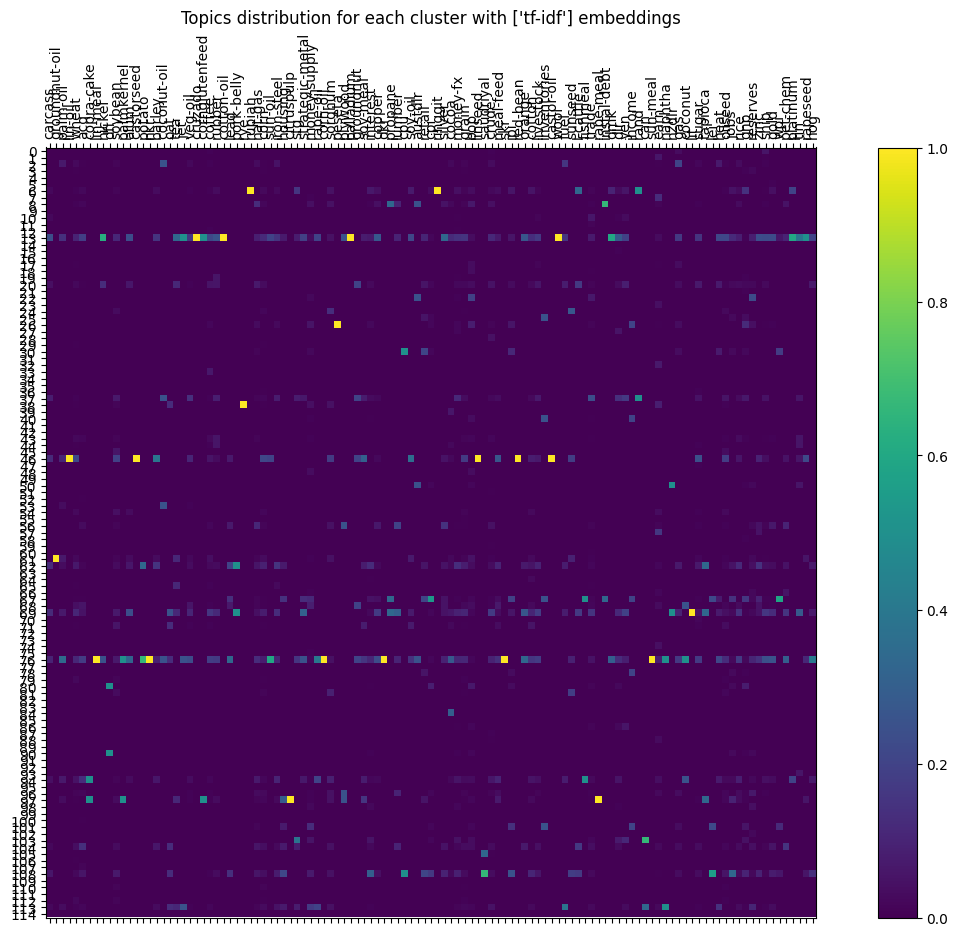

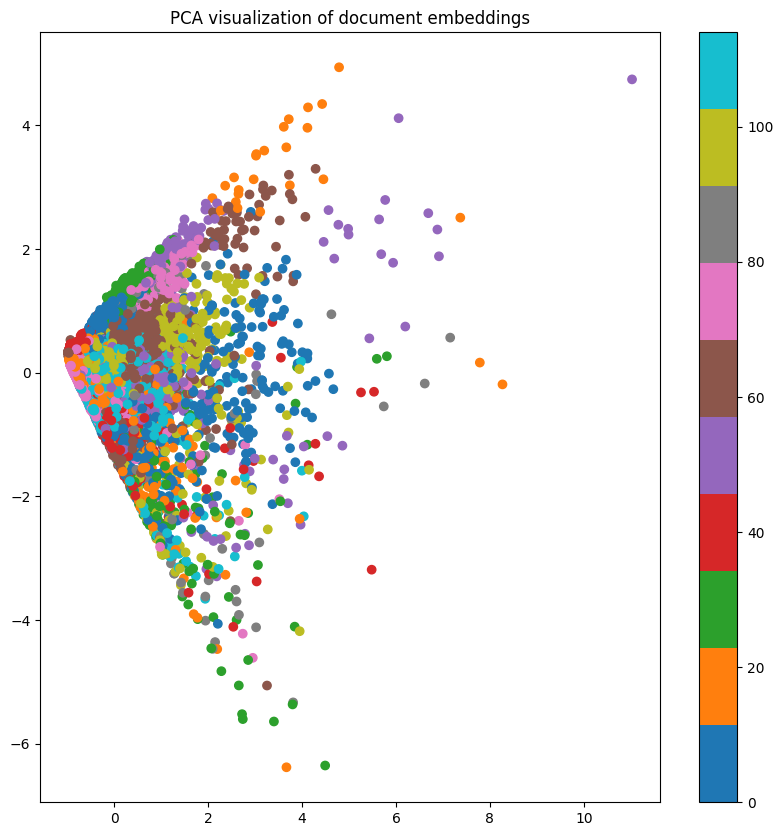

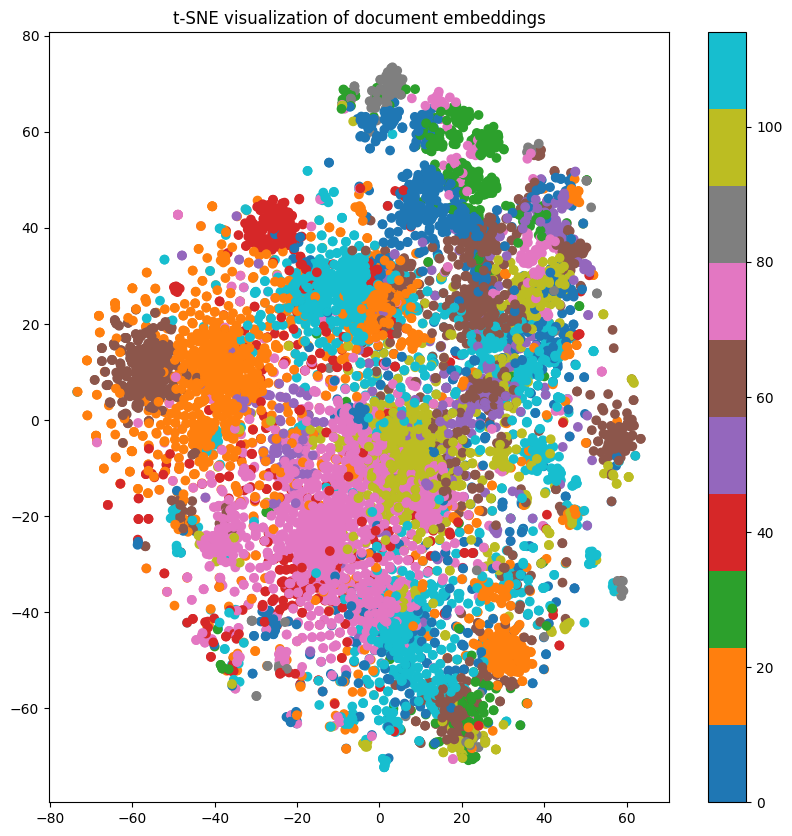

Using random state: 42
WSS: 1258159.1552367033
Silhouette Score: 0.10263389348983765
Clusters Entropy Sum: 325.49578857421875
Clusters Entropy Mean: 2.880493640899658
Clusters Entropy Median: 3.2402243614196777
Purity: 0.3127628266811371
Mean Bit Count: 2.8804938793182373
Sum Bit Count: 325.4958190917969
Median Bit Count: 3.2402243614196777
8816
115


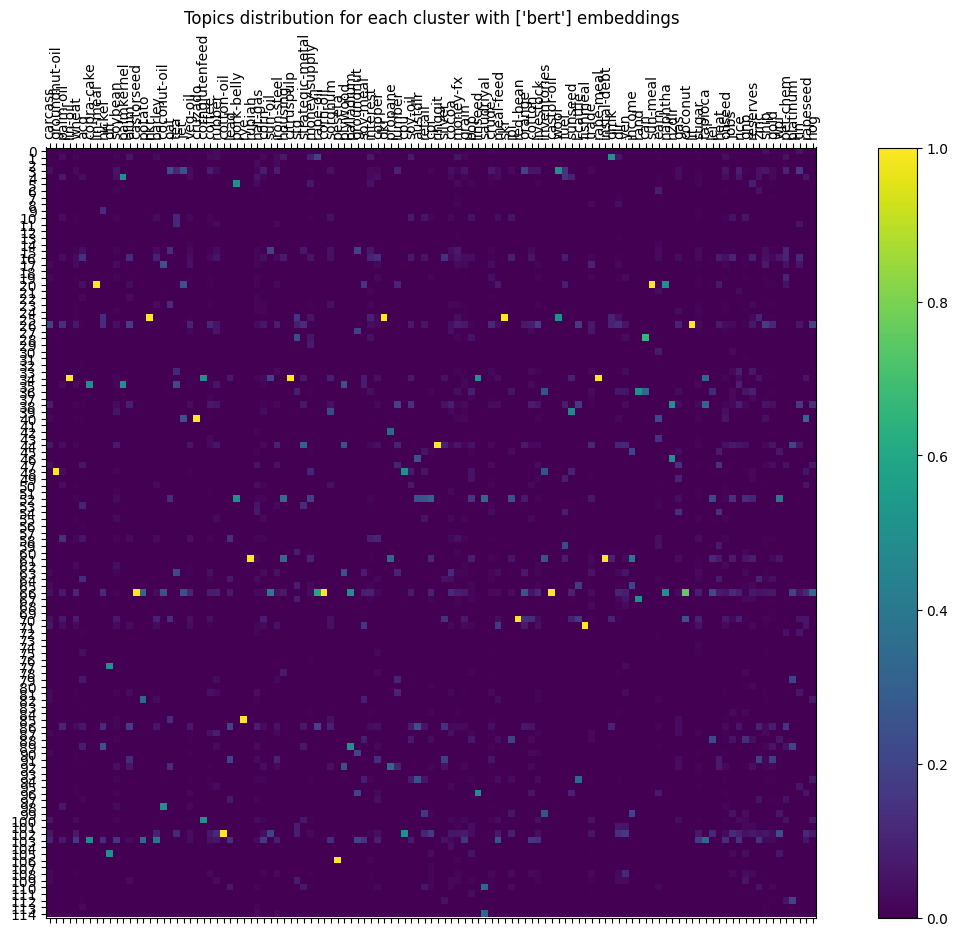

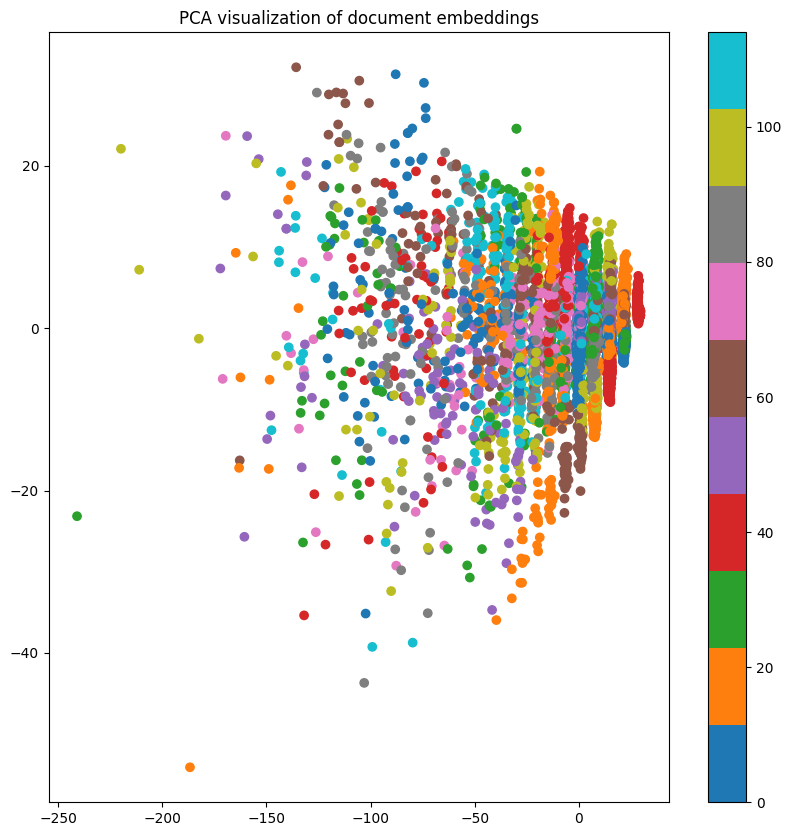

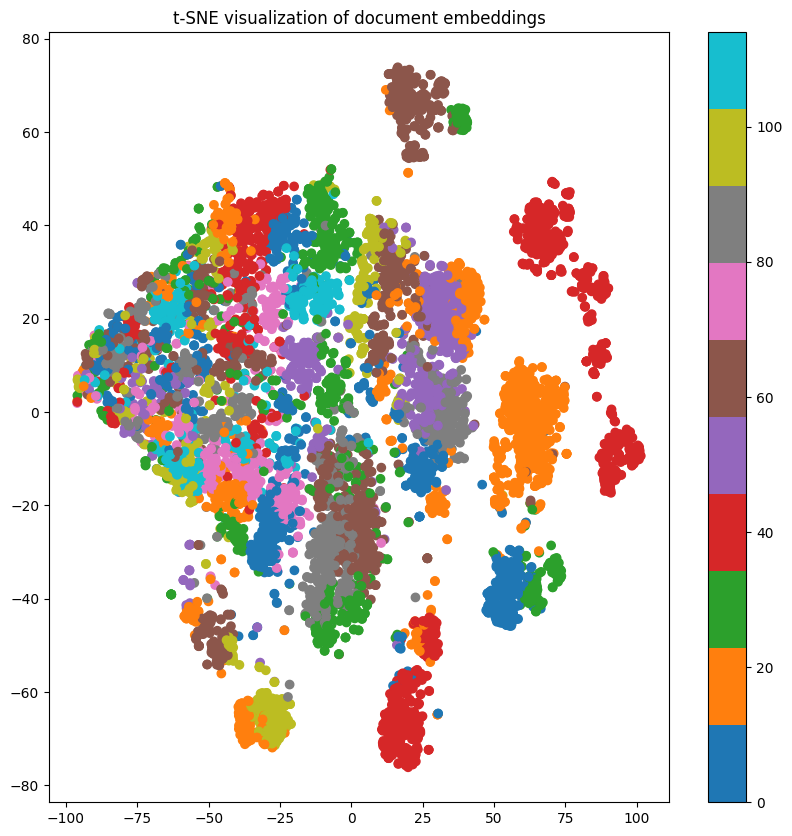

Using random state: 42
WSS: 4252.600331251597
Silhouette Score: 0.03435650831567489
Clusters Entropy Sum: 312.4510498046875
Clusters Entropy Mean: 2.7897415161132812
Clusters Entropy Median: 3.1747395992279053
Purity: 0.31151267886161804
Mean Bit Count: 2.7897415161132812
Sum Bit Count: 312.4510498046875
Median Bit Count: 3.1747400760650635
8816
115


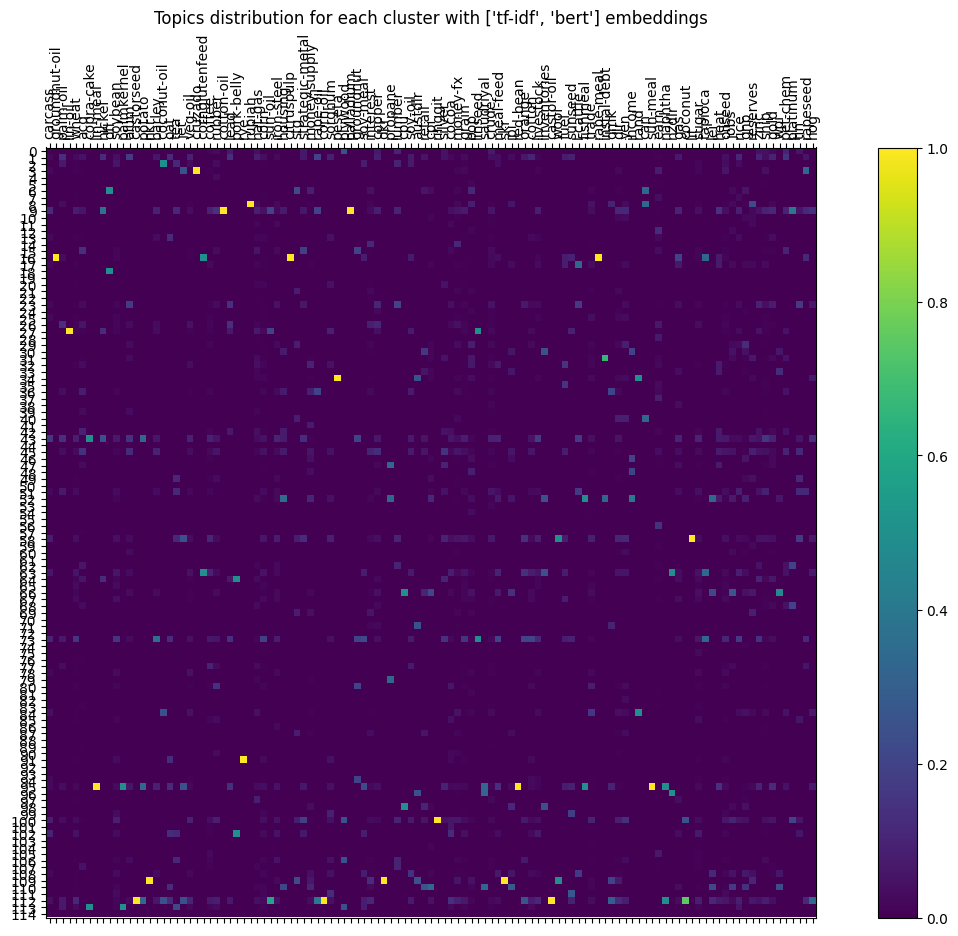

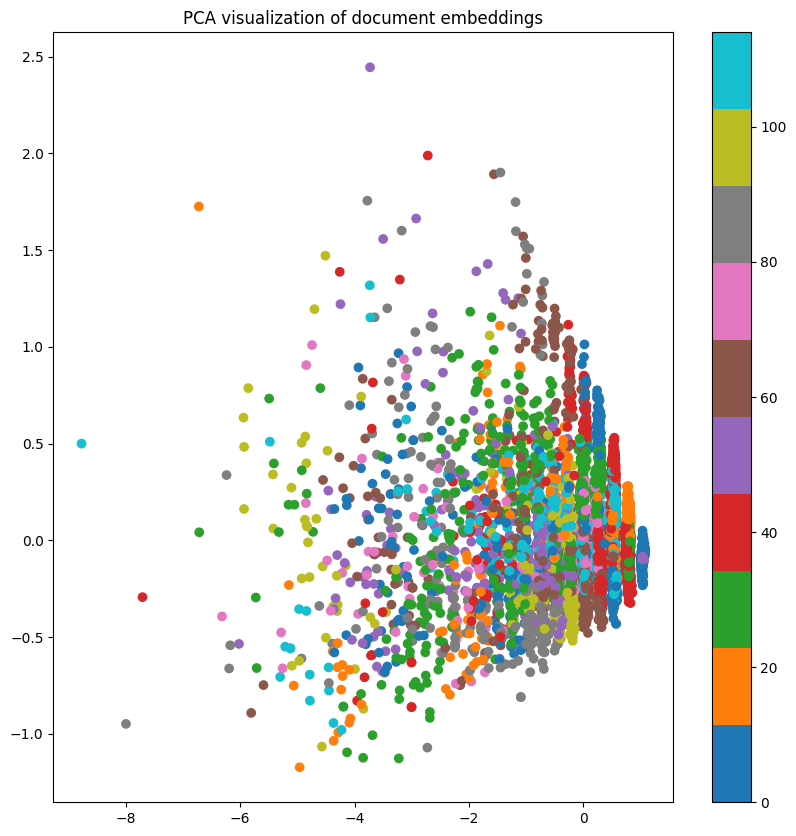

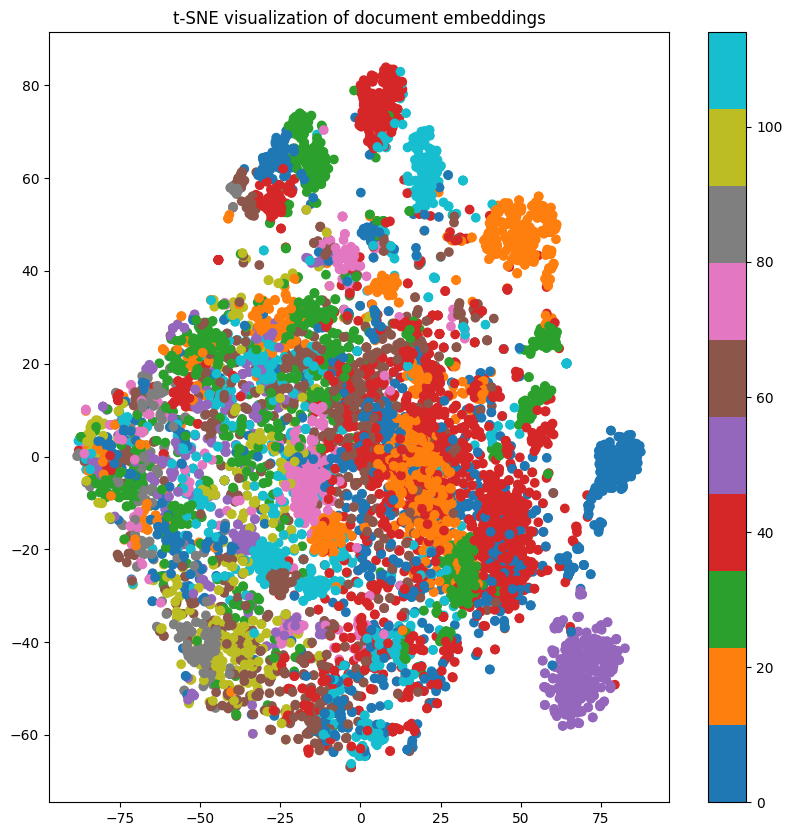

f_new wss: 4252.600331251597
(1/tf_idf_non_0)*f_tf_idf wss + (1/bert_non_0)*f_bert wss: 4007.114125339473

f_new silhouette_avg: 0.03435650831567489
tf_idf silhouette_avg -0.07956244657104876
bert silhouette_avg 0.10263389

f_new mean_ent: 2.7897415161132812
tf_idf mean_ent 2.0391197204589844
bert mean_ent 2.880493640899658

f_new purity: 0.31151267886161804
tf_idf purity 0.3123082220554352
bert purity 0.3127628266811371


In [13]:
cluster_topic_counts_tf_idf_euclidian, unormalized_cluster_topic_counts_tf_idf_euclidian, clustered_docs_tf_idf_euclidian, wss_tf_idf, silhouette_avg_tf_idf, mean_ent_tf_idf, purity_tf_idf = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['tf-idf'], agg_type='sum', method='kmeans', metric='euclidian')
cluster_topic_counts_bert_euclidian, unormalized_cluster_topic_counts_bert_euclidian, clustered_docs_bert_euclidian, wss_bert_euclidian, silhouette_bert_euclidian, mean_ent_bert_euclidian, purity__bert_euclidian = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['bert'], agg_type='sum', method='kmeans', metric='euclidian')
cluster_topic_counts_bert_tf_idf_euclidian, unormalized_cluster_topic_counts_bert_tf_idf_euclidian, clustered_docs_bert_tf_idf_euclidian, wss_bert_tf_idf_euclidian, silhouette_bert_tf_idf_euclidian, mean_ent_bert_tf_idf_euclidian, purity_bert_tf_idf_euclidian = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['tf-idf', 'bert'], agg_type='sum', method='kmeans', metric='euclidian')

tf_idf_idx = general_clustering_model.embbeders_to_idx['tf-idf']
bert_idx = general_clustering_model.embbeders_to_idx['bert']

bert_non_zero = general_clustering_model.mean_non_zero_entries['bert']
tf_idf_non_zero = general_clustering_model.mean_non_zero_entries['tf-idf']

tf_idf_dim = general_clustering_model.embeddings_per_doc_list[0][tf_idf_idx].shape[1]
bert_dim = general_clustering_model.embeddings_per_doc_list[0][bert_idx].shape[1]

print("f_new wss:" , wss_bert_tf_idf_euclidian)
print("(1/tf_idf_non_0)*f_tf_idf wss + (1/bert_non_0)*f_bert wss:", (1/tf_idf_non_zero)*wss_tf_idf + (1/bert_non_zero)*wss_bert_euclidian)
print()
print("f_new silhouette_avg:" , silhouette_bert_tf_idf_euclidian)
print("tf_idf silhouette_avg", silhouette_avg_tf_idf)
print("bert silhouette_avg", silhouette_bert_euclidian)

print()

print("f_new mean_ent:" , mean_ent_bert_tf_idf_euclidian)
print("tf_idf mean_ent", mean_ent_tf_idf)
print("bert mean_ent", mean_ent_bert_euclidian)

print()

print("f_new purity:" , purity_bert_tf_idf_euclidian)
print("tf_idf purity", purity_tf_idf)
print("bert purity", purity__bert_euclidian)

Using random state: 42
93
25


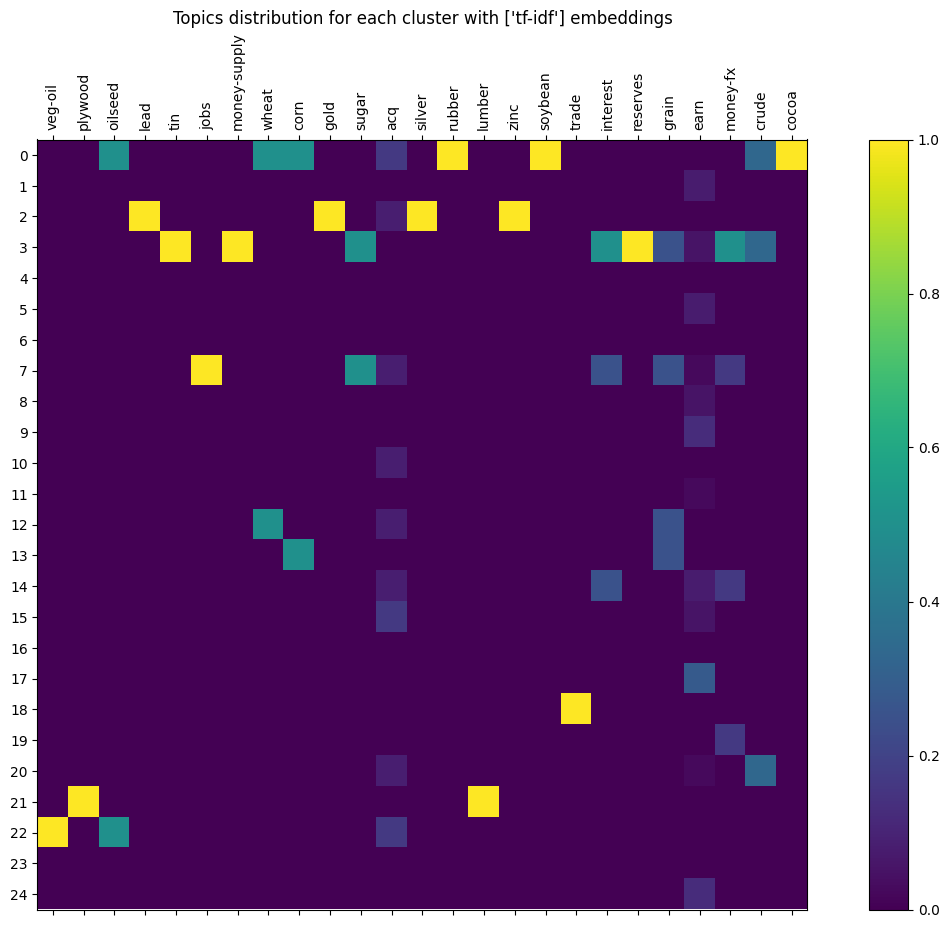

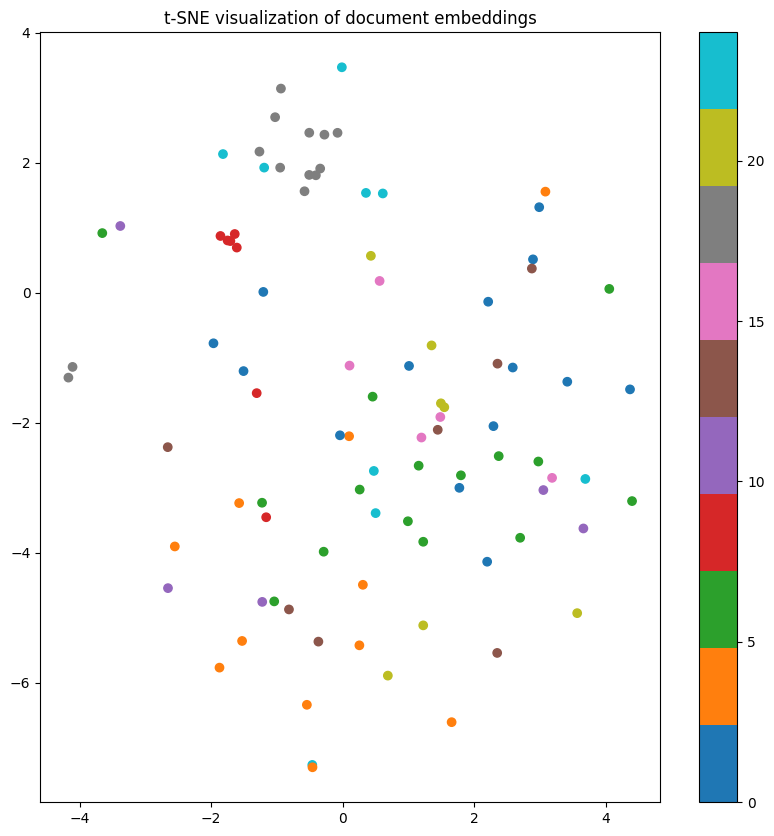

Using random state: 42
93
25


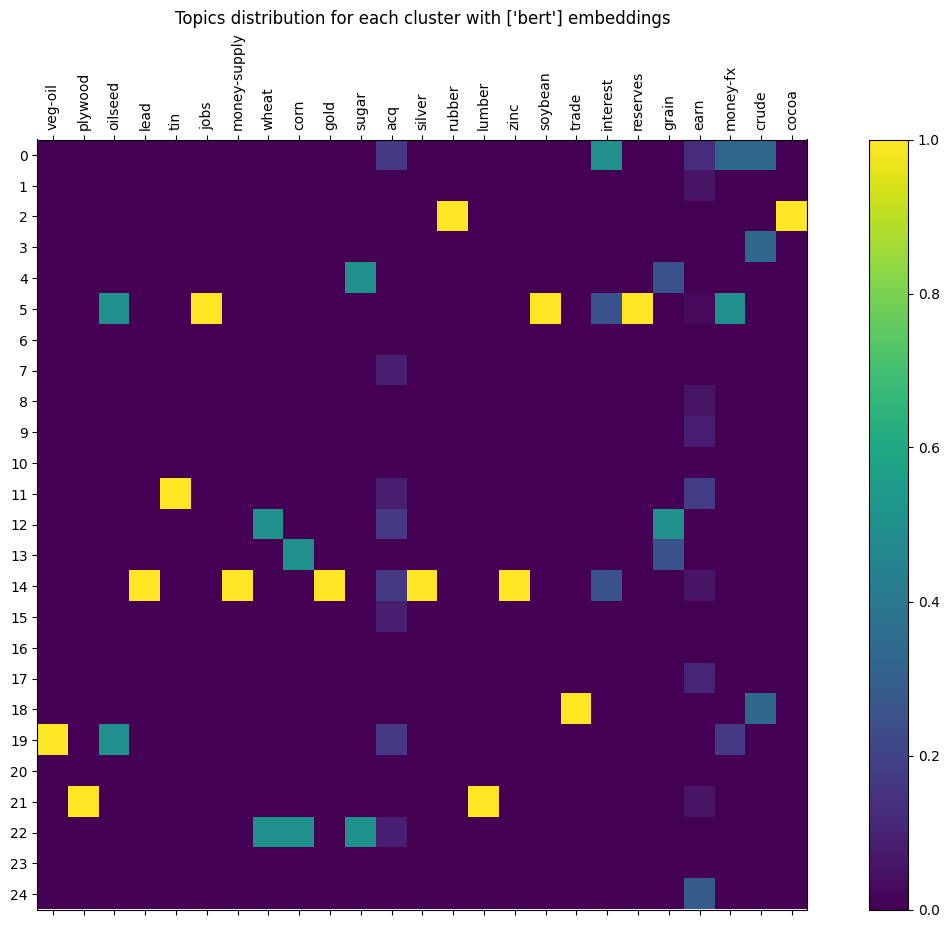

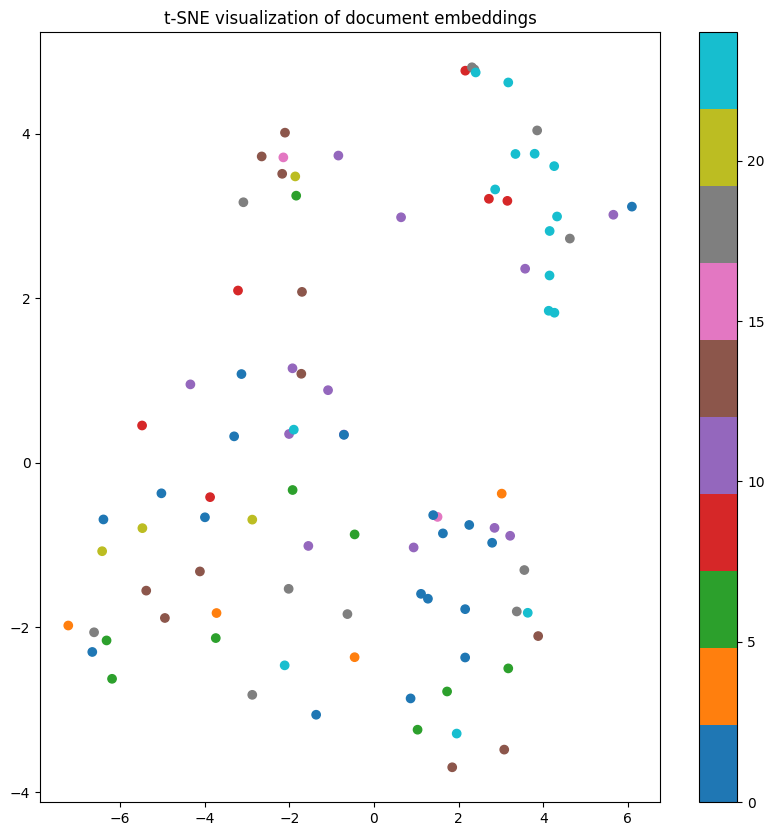

Using random state: 42
93
25


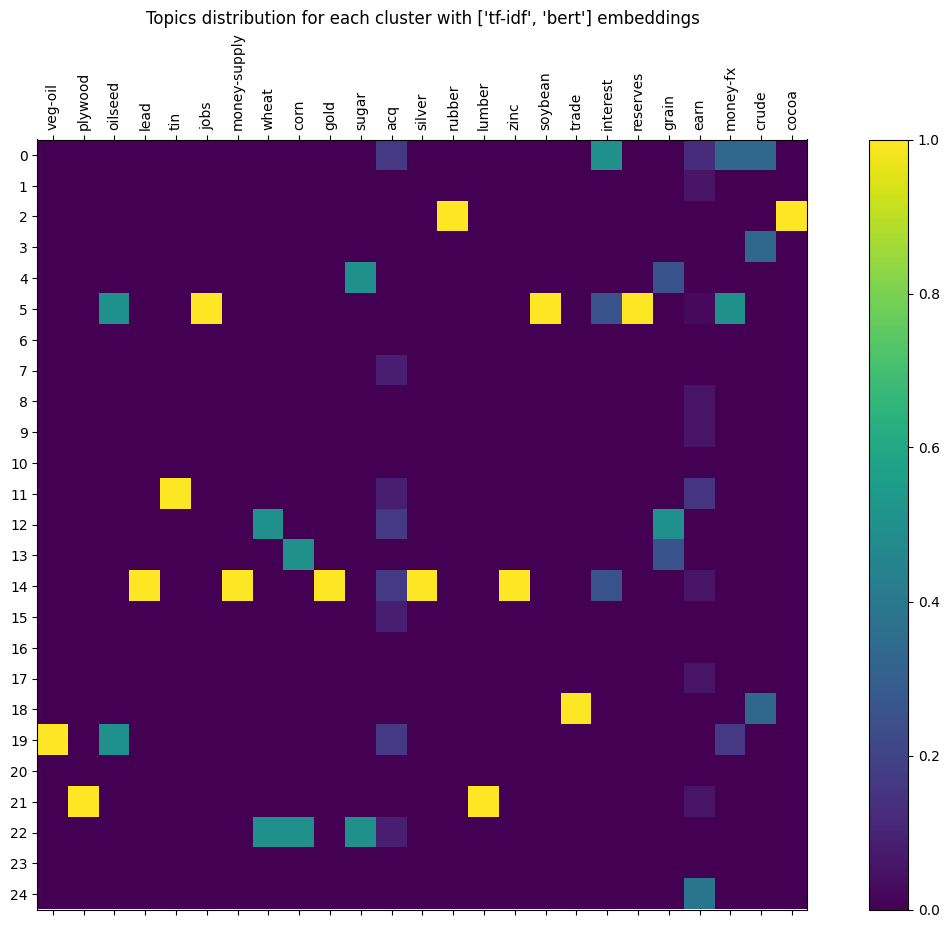

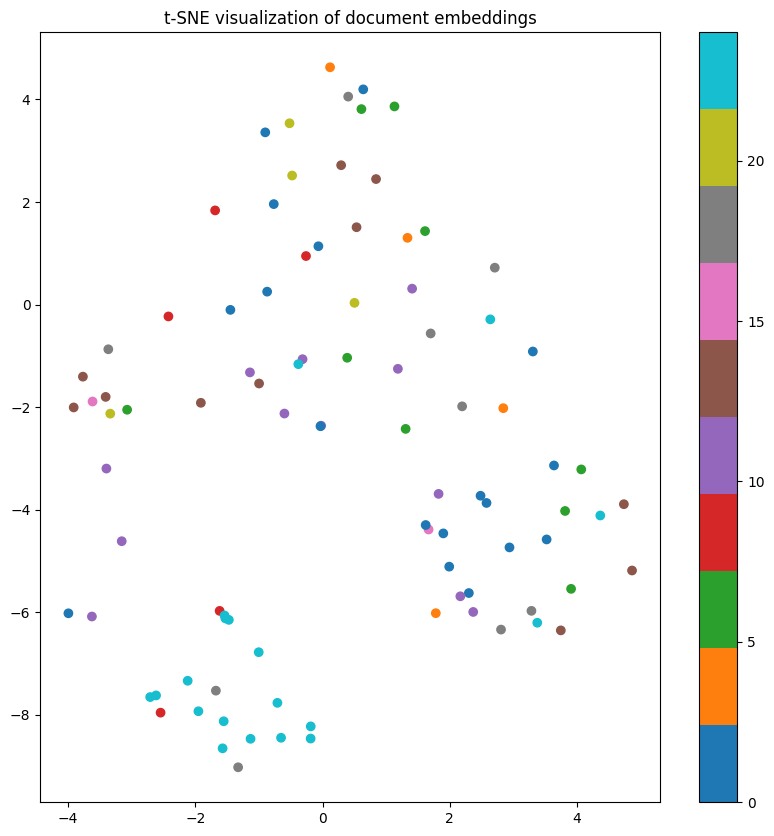

In [22]:
cluster_topic_counts_tf_idf_precomputed, unormalized_cluster_topic_counts_tf_idf_precomputed, clustered_docs_tf_idf_precomputed = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['tf-idf'], agg_type='sum', method='kmeans', metric='precomputed')
cluster_topic_counts_bert_precomputed, unormalized_cluster_topic_counts_bert_precomputed, clustered_docs_bert_precomputed = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['bert'], agg_type='sum', method='kmeans', metric='precomputed')
cluster_topic_counts_bert_tf_idf_precomputed, unormalized_cluster_topic_counts_bert_tf_idf_precomputed, clustered_docs_bert_tf_idf_precomputed = cluster_and_visualize(general_clustering_model, rand_state=42, embbeders_names=['tf-idf', 'bert'], agg_type='sum', method='kmeans', metric='precomputed')

# Visualize Cluster K using Word Cloud

dict_keys(['high', 'feed', 'prices', 'will', 'cause', 'the', 'chinese', 'to', 'reduce', 'hog', 'herd', 'growth', 'and', 'pork', 'production', 'this', 'year', 'agriculture', 'department', 'said', 'in', 'its', 'world', 'trade', 'report', 'numbers', 'at', 'start', 'of', '1987', 'were', 'estimated', '331', 'mln', 'head', 'up', 'slightly', 'from', '1986', '10', 'above', 'earlier', 'projections', 'for', 'was', 'pct', '17', '25', 'tonnes', 'below', 'estimates', 'it', 'is', 'projected', 'fall', '05', 'end', 'january', 'reported', '35', '40', 'ago', 'levels', 'reuter', 'tokyo', 'grain', 'exchange', 'raise', 'margin', 'requirement', 'on', 'spot', 'nearby', 'month', 'soybeans', 'red', 'beans', 'effective', 'march', 'april', 'soybean', 'contracts', 'increase', '90', '000', 'yen', 'per', '15', 'tonne', 'lot', '70', 'now', 'other', 'months', 'stay', 'unchanged', 'except', 'new', 'distant', 'february', 'which', 'be', 'set', '110', 'raised', '130', 'outstanding', '13', 'rises', 'remain', 'august', 'be

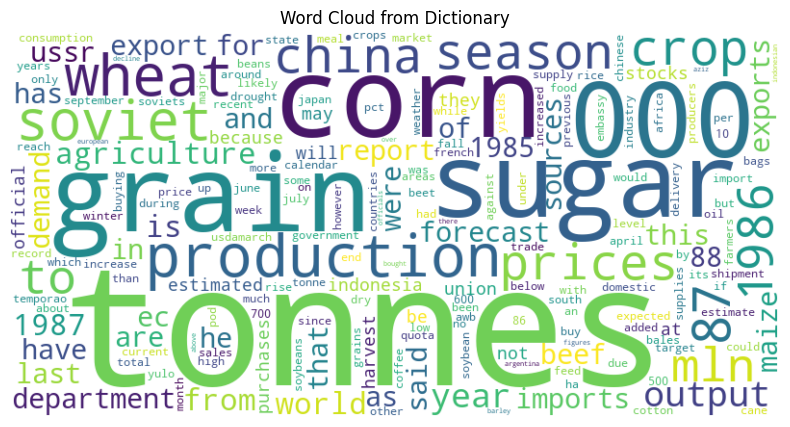

In [31]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Example dictionary of words and their frequencies
# word_frequencies = cluster_topic_counts_bert_tf_idf[8]
# word_frequencies = clustered_docs_bert_tf_idf[107]
# word_frequencies = clustered_docs_bert_tf_idf[0]
# word_frequencies = clustered_docs_bert_tf_idf[21]
# word_frequencies = clustered_docs_bert_tf_idf[72]
word_frequencies = clustered_docs_bert_tf_idf_euclidian[60]

print(word_frequencies.keys())
# Create a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_frequencies)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud from Dictionary')
plt.show()

In [28]:
import numpy as np

def geometric_mean(vectors):
    """Compute the geometric mean of a list of NumPy vectors."""
    vectors = np.array(vectors)  # Convert list to NumPy array
    log_vectors = np.log(vectors)  # Take log to prevent underflow
    mean_log = np.mean(log_vectors, axis=0)  # Compute mean of logs
    return np.exp(mean_log)  # Take exp to get the geometric mean

# Example usage:
vectors = [np.array([1, 2, 3]), np.array([4, 5, 6]), np.array([7, 8, 9])]
geo_mean = geometric_mean(vectors)
print(geo_mean)

[3.03658897 4.30886938 5.45136178]
